In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os

def listfiles(path):
    return [os.path.join(dp, f) for dp, dn, fn in os.walk(path) for f in fn]

def show_cv2(img):
    # swap b and r channels
    b, g, r = cv2.split(img)
    img = cv2.merge([r,g,b])

#     plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.show()

def rand_color():
    def component():
        return random.randint(0,255)
    return (component(), component(), component())

def compute_line(p1, p2):
    A = (p1[1] - p2[1])
    B = (p2[0] - p1[0])
    C = (p1[0]*p2[1] - p2[0]*p1[1])
    return A, B, -C

def line_intersection(p1, p2):
    L1 = compute_line(p1[:2], p1[2:4])
    L2 = compute_line(p2[:2], p2[2:4])

    d  = L1[0] * L2[1] - L1[1] * L2[0]
    dx = L1[2] * L2[1] - L1[1] * L2[2]
    dy = L1[0] * L2[2] - L1[2] * L2[0]
    if d != 0:
        x = dx / d
        y = dy / d
    else:
        # assume negative coordinates are invalid
        x = -1
        y = -1
    return np.asarray((x,y))

In [ ]:
def find_quad(fname):
    img = cv2.imread(fname)

    img_height, img_width, _ = img.shape
    img_diag = int(np.sqrt(img_height ** 2 + img_width ** 2))
    # show_cv2(img)
    img_size = np.linalg.norm(img.shape)

    img_blur = img
    blur_size = 1 + 2 * int(img_size / 100)
    if blur_size > 1:
        blur_size = (blur_size, blur_size)
        img_blur = cv2.GaussianBlur(img, blur_size, 0)
    img_hsv = cv2.cvtColor(img_blur, cv2.COLOR_BGR2HSV)

    #img = cv2.resize(img,(500,500))
    thresh = np.zeros(img.shape[:2], dtype=np.uint8)
    thresh[img_hsv[:,:,2] <= 160] = 255
    thresh[img_hsv[:,:,1] >= 127] = 0

    # plt.imshow(thresh)
    # plt.show()

    #Create default parametrization LSD
    lsd = cv2.createLineSegmentDetector(cv2.LSD_REFINE_NONE)

    #Detect lines in the image
    lines = lsd.detect(thresh)[0] #Position 0 of the returned tuple are the detected lines
    #Draw detected lines in the image
    #img = lsd.drawSegments(img,lines)
    valid_lines = []

    def get_v(l):
        return img_hsv[min(max(int(avg_y + m_y * l), 0), img_height - 1), min(max(int(avg_x + m_x * l), 0), img_width - 1), 2]

    def get_s(l):
        return img_hsv[min(max(int(avg_y + m_y * l), 0), img_height - 1), min(max(int(avg_x + m_x * l), 0), img_width - 1), 1]

    for line in lines:
        p1 = line[0,:2]
        p2 = line[0,2:4]
        length = np.linalg.norm(p2 - p1)
        if length < img_diag / 8:
            continue
        
        p_center = (p1 + p2) / 2.0

#         diff = p2 - p1
#         length = np.linalg.norm(diff)
#         slope = diff / length
        
#         # shrink lines a bit
#         p1 = p_center + slope * length * 0.45
#         p2 = p_center - slope * length * 0.45

        x1, y1 = p1
        x2, y2 = p2
        
        
        p3 = np.asarray([img_width / 2, img_height / 2])

#         d = np.abs(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)
#         if d < img_diag / 15.0:
#             continue
            
        good_line = True
        for i in range(4):            
            avg_x = (x1 * (i + 1) + x2 * (4 - i)) / 5
            avg_y = (y1 * (i + 1) + y2 * (4 - i)) / 5

            m_x = img_width / 2 - avg_x
            m_y = img_height / 2 - avg_y
            m_x /= np.linalg.norm([m_x, m_y])
            m_y /= np.linalg.norm([m_x, m_y])

            if get_v(4) > get_v(-4) + 20 and get_s(3) < 127 and get_s(-3) < 127:
                good_line = False
                break
    
        if good_line:
            valid_lines.append(np.asarray([x1, y1, x2, y2]))

    valid_lines.sort(key=lambda l: -(l[0] ** 2 + l[1] ** 2))

    points = []
    def vote_point(new_p, weight):
        for i in range(len(points)):
            p = points[i][0]
            old_weight = points[i][1]
            if np.linalg.norm(p - new_p) < img_diag / 20:
                p *= old_weight / (weight + old_weight)
                p += new_p * weight / (weight + old_weight)
                points[i][1] += weight
                return
        points.append([new_p, weight])

    for line_index, line in enumerate(valid_lines):
        x1, y1, x2, y2 = line
        p1 = np.asarray([x1, y1])
        p2 = np.asarray([x2, y2])

        slope = p2 - p1
        length = np.linalg.norm(slope)
        slope /= length
        #angle = np.arctan2(diff[1], diff[0])


        vote_point(p1, length / 5)
        vote_point(p2, length / 5)
        cv2.line(img, tuple(p1), tuple(p2), rand_color(), 10)

        for other_line in valid_lines[line_index + 1:]:
            if line is other_line:
                continue

            ox1, oy1, ox2, oy2 = other_line
            op1 = np.asarray([ox1, oy1])
            op2 = np.asarray([ox2, oy2])

            oslope = op2 - op1
            olength = np.linalg.norm(oslope)
            oslope /= olength
            #oangle = np.arctan2(odiff[1], odiff[0])

            intersection = line_intersection(line, other_line)
            
            # intersection pruning
#             if np.mean((intersection - op1) / oslope) * np.mean((intersection - op2) / oslope) < -0:
#                 continue
#             if np.mean((intersection - p1) / slope) * np.mean((intersection - p2) / slope) < -0:
#                 continue
            if np.linalg.norm((p1 + p2) / 2 - intersection) < length * 0.35:
                continue
            if np.linalg.norm((op1 + op2) / 2 - intersection) < olength * 0.35:
                continue

            if 0 <= intersection[0] < img_width and 0 <= intersection[1] <= img_height:# and np.abs(slope @ oslope) < 0.5:
                vote_point(intersection, (length + olength))#max([length, olength]) + np.mean([length, olength]))

    done = False

    for p in points:
        print(p)
        p = p[0]
        cv2.circle(img, tuple(p), int(img_size / 50) + 3, rand_color(), thickness=5)

    while done == False:
        points.sort(key=lambda p: -p[1])
#         print(points)
        final_points = points[:4]
        final_points.sort(key=lambda p: np.arctan2(p[0][1] - img_height / 2, p[0][0] - img_width / 2))

        done = True
        for i in range(4):
            v1 = (final_points[i][0] - final_points[i - 1][0]).astype(np.float32)
            v2 = (final_points[i][0] - final_points[(i + 1) % len(final_points)][0]).astype(np.float32)
            v1 /= np.linalg.norm(v1)
            v2 /= np.linalg.norm(v2)
            theta = np.arccos(v1 @ v2)
    #         print(theta)
            if theta < np.pi / 25 or theta > np.pi * 24 / 25:
                print("xxx")
                done = False
                # a bit hacky
                final_points[i][-1] = -1

    final_points = np.asarray([p[0] for p in final_points], dtype=np.int32)

    cv2.drawContours(img, [final_points], 0, (0,0,255), 4)
#     plt.imshow(thresh)
#     plt.show()
    show_cv2(img)

0
[array([191.1712 , 184.09468], dtype=float32), 15.04144287109375]
[array([218.99977, 114.22555], dtype=float32), 15.04144287109375]
[array([228.86931 ,  91.578064], dtype=float32), 238.47122802734376]
[array([105.842865,  47.16882 ], dtype=float32), 388.33923034667964]
[array([ 38.210663, 225.86102 ], dtype=float32), 432.0588897705078]
[array([196.11081, 296.10233], dtype=float32), 34.497283935546875]


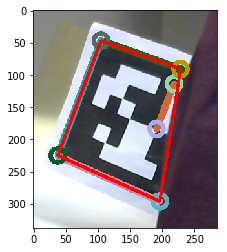

1
[array([271.75806, 244.31146], dtype=float32), 637.2573013305664]
[array([286.54767 ,  50.740803], dtype=float32), 411.92710266113284]
[array([150.16965, 244.64499], dtype=float32), 43.27679595947266]
[array([ 44.49453, 244.94154], dtype=float32), 645.304296875]
[array([120.59252 ,  54.541004], dtype=float32), 32.53034362792969]
[array([72.05272, 56.4338 ], dtype=float32), 385.82493286132814]
[array([223.13629, 143.12604], dtype=float32), 13.33157958984375]
[array([229.21468,  76.74586], dtype=float32), 13.33157958984375]
[array([213.91516, 243.82756], dtype=float32), 165.50491]


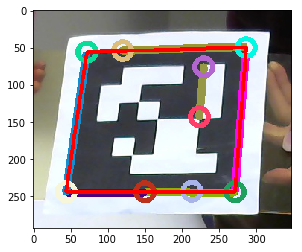

2
[array([250.92586, 224.6505 ], dtype=float32), 451.4275604248047]
[array([298.10522 ,  57.506046], dtype=float32), 434.5104858398438]
[array([101.536446,  47.652332], dtype=float32), 424.418408203125]
[array([223.75642, 132.9385 ], dtype=float32), 12.187969207763672]
[array([241.34656,  74.59254], dtype=float32), 12.187969207763672]
[array([ 44.543198, 208.89723 ], dtype=float32), 441.3354522705078]


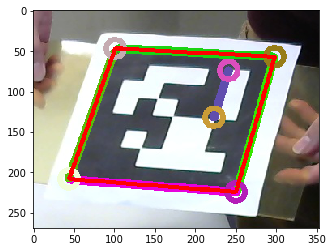

3
[array([292.32718, 257.84616], dtype=float32), 581.6485443115234]
[array([285.07596, 109.40229], dtype=float32), 29.550506591796875]
[array([281.4036 ,  35.52031], dtype=float32), 256.96033]
[array([172.07777, 263.43903], dtype=float32), 279.3770324707031]
[array([ 53.061398, 268.91904 ], dtype=float32), 714.8754791259767]
[array([165.62889 ,  45.669353], dtype=float32), 21.84156188964844]
[array([54.56668, 55.70144], dtype=float32), 381.56422119140626]
xxx


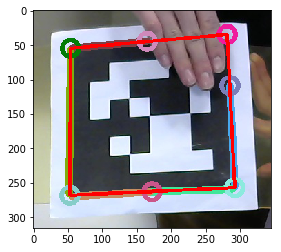

4
[array([293.0465 , 253.69261], dtype=float32), 631.1235565185548]
[array([311.24213 ,  44.245956], dtype=float32), 353.7941925048828]
[array([186.89847, 253.48053], dtype=float32), 37.7650650024414]
[array([ 43.779903, 253.2775  ], dtype=float32), 631.0635864257813]
[array([240.8493, 145.6496], dtype=float32), 13.85882110595703]
[array([248.40146 ,  76.768265], dtype=float32), 13.85882110595703]
[array([229.15509, 252.3095 ], dtype=float32), 155.59172]
[array([251.90324 ,  44.829697], dtype=float32), 193.01955]
[array([100.604454, 254.29451 ], dtype=float32), 17.259523010253908]
[array([204.26662,  47.14526], dtype=float32), 24.745088195800783]
[array([79.61516, 53.42572], dtype=float32), 389.69139556884767]


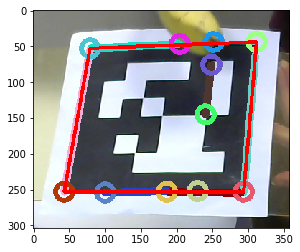

5
[array([287.1668 , 263.84744], dtype=float32), 540.4202667236328]
[array([281.35275,  42.75808], dtype=float32), 524.2798797607421]
[array([54.63809, 55.8074 ], dtype=float32), 455.19023742675785]
[array([ 48.98978, 271.49097], dtype=float32), 439.5653106689453]
[array([224.73299, 150.64224], dtype=float32), 14.761741638183594]
[array([223.30609,  76.84733], dtype=float32), 14.761741638183594]
[array([ 50.079853, 218.1438  ], dtype=float32), 31.765374755859376]


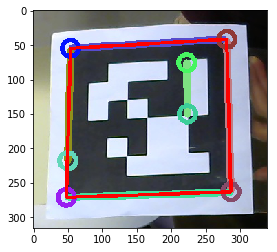

6
[array([303.57178, 268.39636], dtype=float32), 389.7594757080078]
[array([313.55768, 108.22991], dtype=float32), 32.03132629394531]
[array([317.6047  ,  43.319324], dtype=float32), 281.4595]
[array([246.79689, 152.95378], dtype=float32), 15.38054962158203]
[array([256.6294,  76.6822], dtype=float32), 15.38054962158203]
[array([234.07565, 267.38306], dtype=float32), 313.98854370117186]
[array([260.7711  ,  44.554893], dtype=float32), 198.20561]
[array([ 48.201496, 264.3789  ], dtype=float32), 492.0690673828125]
[array([203.12898 ,  45.808037], dtype=float32), 24.260572814941405]
[array([78.99915, 48.84794], dtype=float32), 400.5466934204101]
xxx


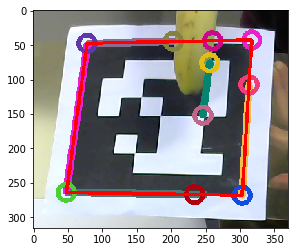

7
[array([281.9794 , 260.47305], dtype=float32), 514.6177368164062]
[array([278.55667 ,  40.252373], dtype=float32), 460.667724609375]
[array([106.86336,  43.86317], dtype=float32), 33.76401062011719]
[array([48.409245, 45.19306 ], dtype=float32), 233.83139]
[array([ 66.86048, 263.06113], dtype=float32), 42.755679321289065]
[array([ 43.218266, 263.25937 ], dtype=float32), 291.79200286865233]
[array([220.46532, 146.8756 ], dtype=float32), 15.250209045410156]
[array([220.43332,  70.62456], dtype=float32), 15.250209045410156]
[array([ 44.797573, 196.91481 ], dtype=float32), 13.002268981933593]


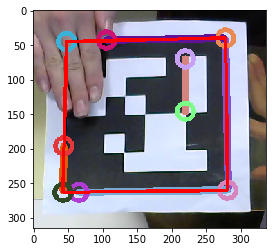

8
[array([258.90787, 175.24246], dtype=float32), 397.13070983886723]
[array([306.47205,  64.34338], dtype=float32), 369.8009735107422]
[array([109.635284,  44.847027], dtype=float32), 380.52469635009766]
[array([ 42.56585, 152.17282], dtype=float32), 407.8544326782227]


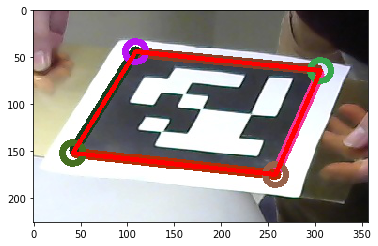

9
[array([307.95996, 276.86755], dtype=float32), 543.3255645751952]
[array([316.07022 ,  52.830868], dtype=float32), 523.8961303710937]
[array([75.05511, 56.39889], dtype=float32), 540.5382537841797]
[array([248.62418, 159.33398], dtype=float32), 15.531468200683594]
[array([252.8597 ,  81.79223], dtype=float32), 15.531468200683594]
[array([ 50.79681, 274.61847], dtype=float32), 559.9676879882812]


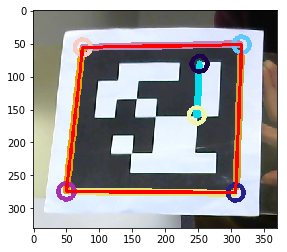

10
[array([237.93436, 262.81543], dtype=float32), 472.3913116455078]
[array([261.59155,  51.70409], dtype=float32), 472.8507537841797]
[array([ 90.38584, 291.6204 ], dtype=float32), 11.824227142333985]
[array([147.87102, 305.4321 ], dtype=float32), 11.824227142333985]
[array([ 44.212845, 280.52664 ], dtype=float32), 256.38757]
[array([68.72344, 45.3903 ], dtype=float32), 458.94495849609376]
[array([200.42336, 153.10345], dtype=float32), 15.349610900878906]
[array([208.57571,  76.78961], dtype=float32), 15.349610900878906]
[array([ 48.213524, 245.64285 ], dtype=float32), 458.485546875]


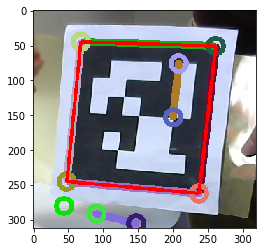

11
[array([286.42093, 251.65239], dtype=float32), 533.9517333984375]
[array([308.09772 ,  42.306324], dtype=float32), 608.1939819335937]
[array([241.82964 ,  43.120922], dtype=float32), 12.519012451171875]
[array([217.21223 ,  42.224525], dtype=float32), 147.72964]
[array([77.56514, 43.67317], dtype=float32), 597.8165390014649]
[array([ 37.840694, 247.00282 ], dtype=float32), 525.8324676513672]
[array([163.18158,  44.48013], dtype=float32), 17.026918029785158]


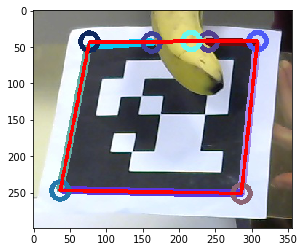

12
[array([301.8247 , 267.91888], dtype=float32), 735.4404541015624]
[array([316.48135 ,  43.510227], dtype=float32), 374.0391815185547]
[array([123.16837, 262.66577], dtype=float32), 47.516345214843746]
[array([ 46.969185, 260.60394 ], dtype=float32), 706.7784820556641]
[array([200.60612 ,  44.862133], dtype=float32), 24.2611328125]
[array([77.580315, 48.580345], dtype=float32), 394.40009765625]


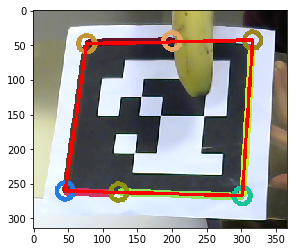

13
[array([277.50806, 280.80167], dtype=float32), 245.87387237548828]
[array([283.59683, 228.1796 ], dtype=float32), 11.070771789550781]
[array([302.09467,  68.311  ], dtype=float32), 221.69815]
[array([221.1924 , 270.04922], dtype=float32), 406.26361083984375]
[array([251.89067, 111.63615], dtype=float32), 31.820755004882812]
[array([259.28735 ,  63.444782], dtype=float32), 358.7169189453125]
[array([193.54323, 159.45311], dtype=float32), 14.26691131591797]
[array([206.63853,  89.33084], dtype=float32), 14.26691131591797]
[array([74.25432, 43.12557], dtype=float32), 424.06142272949216]
[array([ 40.104797, 236.47874 ], dtype=float32), 439.7873291015625]


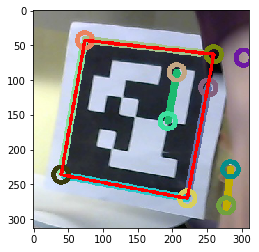

14
[array([292.2337 , 262.38797], dtype=float32), 728.9750946044921]
[array([281.12592 ,  40.331764], dtype=float32), 348.18858337402344]
[array([135.55432, 269.51807], dtype=float32), 46.051263427734376]
[array([ 53.79726, 273.25797], dtype=float32), 920.2798889160156]
[array([149.10323 ,  51.484234], dtype=float32), 18.535780334472655]
[array([53.93833, 60.52838], dtype=float32), 427.8937881469726]
[array([ 53.706886, 139.37535 ], dtype=float32), 41.75003662109375]


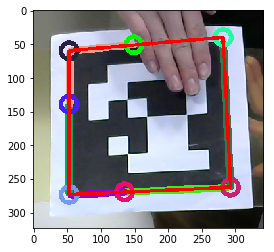

15
[array([198.14148, 280.34714], dtype=float32), 380.0501251220703]
[array([248.8184  , 127.940315], dtype=float32), 31.623825073242188]
[array([261.23923,  90.50767], dtype=float32), 247.37723]
[array([188.07509, 171.85849], dtype=float32), 13.914356994628907]
[array([209.91844, 105.80471], dtype=float32), 13.914356994628907]
[array([218.86491,  78.75074], dtype=float32), 158.8299]
[array([ 42.444878, 223.8642  ], dtype=float32), 410.88735046386716]
[array([188.55089,  70.34   ], dtype=float32), 17.851620483398438]
[array([98.765205, 45.516052], dtype=float32), 327.6898681640625]


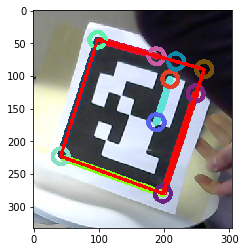

16
[array([293.48648, 260.47522], dtype=float32), 936.7592819213867]
[array([288.9066, 133.1697], dtype=float32), 42.0357177734375]
[array([285.39062,  36.80166], dtype=float32), 580.6693862915039]
[array([188.76259, 264.3529 ], dtype=float32), 282.21842651367183]
[array([ 55.286533, 269.1781  ], dtype=float32), 720.3069732666015]
[array([131.97148 ,  50.439934], dtype=float32), 14.304660034179687]
[array([58.19298, 57.39979], dtype=float32), 336.38605651855465]


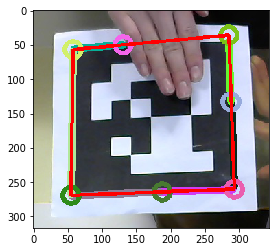

17
[array([149.10696, 221.14317], dtype=float32), 9.930086517333985]
[array([198.30942, 214.48856], dtype=float32), 9.930086517333985]
[array([129.93466, 223.73619], dtype=float32), 101.72603]
[array([189.35574   ,   0.31326228], dtype=float32), 28.553677368164063]
[array([46.859043,  9.116728], dtype=float32), 28.553677368164063]
[array([118.41761, 111.73838], dtype=float32), 11.629369354248047]
[array([93.81759, 59.05162], dtype=float32), 11.629369354248047]
[array([ 2.890127, 19.521116], dtype=float32), 10.415118408203124]
[array([30.398228, 63.738438], dtype=float32), 10.415118408203124]


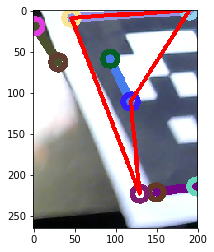

18
[array([294.8764, 268.7222], dtype=float32), 737.6950805664062]
[array([302.11865 ,  48.571236], dtype=float32), 532.9614624023437]
[array([203.13461, 269.47095], dtype=float32), 48.762979125976564]
[array([ 45.969116, 271.0481  ], dtype=float32), 739.7586303710937]
[array([68.575386, 56.81989 ], dtype=float32), 526.8526641845702]
[array([236.78377, 154.43709], dtype=float32), 16.030584716796874]
[array([241.07222 ,  74.398964], dtype=float32), 16.030584716796874]
[array([230.67548, 268.44022], dtype=float32), 235.21783]


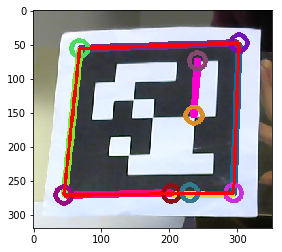

19
[array([286.89987, 267.3821 ], dtype=float32), 540.1181396484375]
[array([283.73682,  45.16664], dtype=float32), 477.1765167236328]
[array([100.587105,  48.989563], dtype=float32), 36.269229125976565]
[array([53.15129, 50.50322], dtype=float32), 438.08852233886716]
[array([ 46.885883, 270.73062 ], dtype=float32), 537.2993438720703]
[array([225.45042, 153.12494], dtype=float32), 15.5]
[array([225.45389,  75.62494], dtype=float32), 15.5]


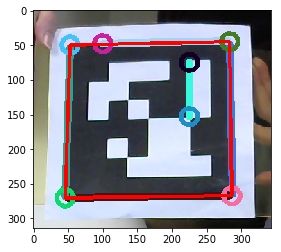

20
[array([284.9736 , 262.18793], dtype=float32), 530.0482208251952]
[array([296.53314 ,  46.670666], dtype=float32), 516.570263671875]
[array([68.91193 , 48.294437], dtype=float32), 517.6595184326171]
[array([231.14279, 149.23192], dtype=float32), 15.513772583007812]
[array([236.72731,  71.86434], dtype=float32), 15.513772583007812]
[array([ 46.43915, 260.84735], dtype=float32), 531.1374755859375]


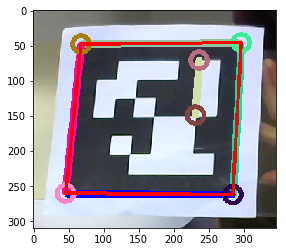

21
[array([288.21115, 267.36343], dtype=float32), 534.5167266845704]
[array([280.7147  ,  51.188835], dtype=float32), 343.8475372314453]
[array([204.33849 ,  53.094734], dtype=float32), 14.772512817382813]
[array([53.53434, 58.28729], dtype=float32), 318.4281707763672]
[array([ 50.126244, 275.4132  ], dtype=float32), 523.869873046875]


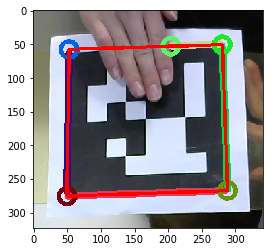

22
[array([301.81717, 269.04126], dtype=float32), 431.9597961425781]
[array([318.15353 ,  47.832245], dtype=float32), 624.0770881652833]
[array([258.0844 ,  45.96712], dtype=float32), 336.07641372680666]
[array([223.40054 ,  45.822266], dtype=float32), 170.09253]
[array([81.48838 , 45.701126], dtype=float32), 661.5756057739258]
[array([247.3413 , 153.04498], dtype=float32), 15.323487854003906]
[array([255.12326,  76.82378], dtype=float32), 15.323487854003906]
[array([236.3971, 267.9449], dtype=float32), 306.16046142578125]
[array([ 48.79177, 264.70135], dtype=float32), 486.0231475830078]
[array([190.65538 ,  46.725773], dtype=float32), 21.269499206542967]


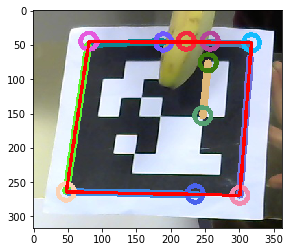

23
[array([283.5698 , 211.89168], dtype=float32), 33.013632202148436]
[array([279.7482 ,  41.79173], dtype=float32), 464.16848449707027]
[array([284.4184 , 260.04755], dtype=float32), 445.81097412109375]
[array([52.79652 , 54.001396], dtype=float32), 713.2169815063477]
[array([ 47.598797, 267.7723  ], dtype=float32), 740.5739776611329]
[array([222.9849 , 149.37761], dtype=float32), 15.506613159179688]
[array([221.54533,  71.85791], dtype=float32), 15.506613159179688]
[array([ 50.02169, 161.90527], dtype=float32), 41.02456512451172]


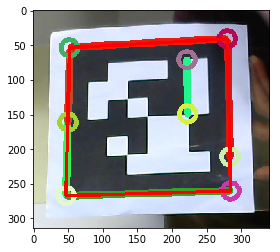

24
[array([281.51712, 259.6166 ], dtype=float32), 528.0950653076172]
[array([278.6001  ,  40.997196], dtype=float32), 448.6618682861328]
[array([109.3585 ,  43.59416], dtype=float32), 33.26370544433594]
[array([48.870655, 44.87241 ], dtype=float32), 230.07896]
[array([ 43.299164, 262.81088 ], dtype=float32), 355.5279083251953]
[array([ 44.70596, 198.16795], dtype=float32), 12.75208740234375]


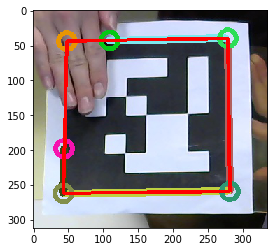

25
[array([236.42   , 275.25797], dtype=float32), 476.67502746582034]
[array([263.43124 ,  63.533554], dtype=float32), 470.8391571044922]
[array([66.57266 , 48.013565], dtype=float32), 459.5591278076172]
[array([199.9881 , 163.19998], dtype=float32), 14.883702087402344]
[array([209.0217  ,  89.331795], dtype=float32), 14.883702087402344]
[array([ 45.4393 , 250.80417], dtype=float32), 465.39499816894534]


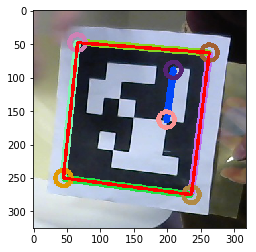

26
[array([263.08844, 192.16249], dtype=float32), 412.9000457763672]
[array([298.4226 ,  62.24546], dtype=float32), 392.0864501953125]
[array([99.7446 , 47.12479], dtype=float32), 393.3413848876953]
[array([ 46.47325, 177.19324], dtype=float32), 414.15498046875]


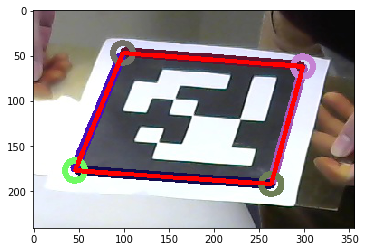

27
[array([259.9333 , 176.48495], dtype=float32), 393.7196746826172]
[array([295.9944 ,  64.59365], dtype=float32), 371.3431671142578]
[array([97.50686, 45.98445], dtype=float32), 383.46851806640626]
[array([ 41.19673, 159.1146 ], dtype=float32), 405.8449951171875]


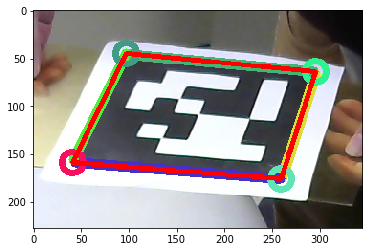

28
[array([284.48306, 236.877  ], dtype=float32), 37.5006103515625]
[array([284.2455  ,  44.764015], dtype=float32), 657.7940567016601]
[array([284.24518, 266.15616], dtype=float32), 468.0580200195312]
[array([163.40172 ,  50.164406], dtype=float32), 268.8063705444336]
[array([56.452072, 55.4264  ], dtype=float32), 707.566845703125]
[array([ 46.2304, 269.1346], dtype=float32), 531.4872772216796]
[array([224.45619, 153.12642], dtype=float32), 15.256428527832032]
[array([225.7964 ,  76.85605], dtype=float32), 15.256428527832032]
[array([226.32823 ,  46.589027], dtype=float32), 193.87714]


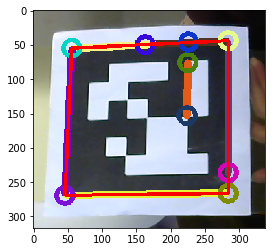

29
[array([292.71667, 269.5039 ], dtype=float32), 549.2792022705079]
[array([286.62085 ,  45.868027], dtype=float32), 537.3344238281251]
[array([54.689693, 52.449993], dtype=float32), 446.91441650390624]
[array([ 51.450336, 274.1479  ], dtype=float32), 493.6127960205078]
[array([229.70319, 154.39426], dtype=float32), 15.512283325195312]
[array([228.08298,  76.84976], dtype=float32), 15.512283325195312]
[array([53.769855, 99.402054], dtype=float32), 34.75360107421875]


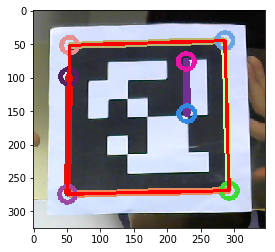

30
[array([298.73822, 272.77103], dtype=float32), 544.746826171875]
[array([308.51236 ,  49.155876], dtype=float32), 544.7688354492187]
[array([68.49851 , 52.884083], dtype=float32), 538.9843505859375]
[array([240.71773, 155.63057], dtype=float32), 15.297532653808593]
[array([245.30896,  79.28083], dtype=float32), 15.297532653808593]
[array([ 43.855606, 270.682   ], dtype=float32), 538.9623413085938]


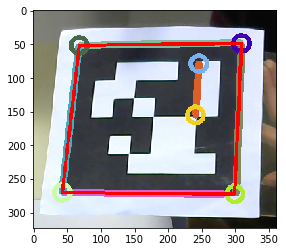

31
[array([293.73007, 256.28763], dtype=float32), 536.3304962158203]
[array([282.37564,  34.23365], dtype=float32), 353.07350463867186]
[array([ 54.581337, 267.67282 ], dtype=float32), 529.8937866210938]
[array([155.65205,  44.67344], dtype=float32), 19.82733917236328]
[array([54.510593, 54.4636  ], dtype=float32), 366.4641342163086]


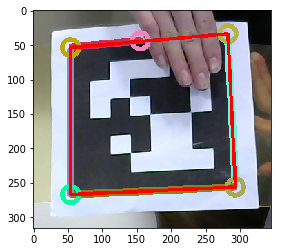

32
[array([309.46292, 274.34454], dtype=float32), 801.04111328125]
[array([291.80206, 125.91884], dtype=float32), 47.452909851074224]
[array([280.5074  ,  30.007607], dtype=float32), 970.5405151367188]
[array([ 64.30728, 288.72382], dtype=float32), 571.1261718750001]
[array([177.85097 ,  33.756115], dtype=float32), 274.73071441650393]
[array([48.005363, 39.508472], dtype=float32), 767.3448516845704]
[array([233.3854 , 151.94875], dtype=float32), 17.332350158691405]
[array([226.94559 ,  65.526596], dtype=float32), 17.332350158691405]
[array([224.41808 ,  31.607452], dtype=float32), 216.75415]


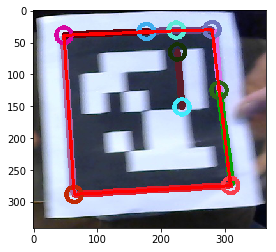

33
[array([238.00352, 270.3908 ], dtype=float32), 476.28782958984374]
[array([257.0779  ,  57.838093], dtype=float32), 661.133982849121]
[array([178.18436 ,  53.688107], dtype=float32), 38.05155792236328]
[array([60.877304, 48.057247], dtype=float32), 646.2542144775391]
[array([ 46.334644, 250.36572 ], dtype=float32), 464.0588012695312]
[array([197.55424, 159.4317 ], dtype=float32), 15.07279052734375]
[array([203.82324,  84.32894], dtype=float32), 15.07279052734375]
[array([206.26462 ,  55.081146], dtype=float32), 189.34314]


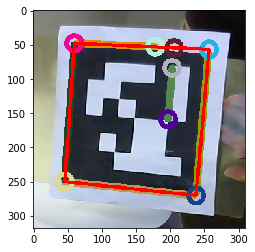

34
[array([276.86865, 267.6072 ], dtype=float32), 537.3936798095704]
[array([284.69046,  43.41673], dtype=float32), 514.7997436523438]
[array([61.03927 , 45.466644], dtype=float32), 508.0224609375]
[array([222.86082, 150.61208], dtype=float32), 16.255018615722655]
[array([226.83302,  69.43411], dtype=float32), 16.255018615722655]
[array([ 43.21544, 262.88818], dtype=float32), 530.6164276123046]


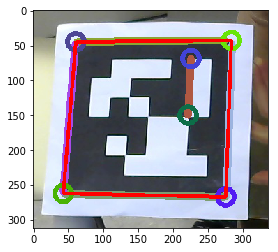

35
[array([291.636  , 241.53323], dtype=float32), 683.0211410522461]
[array([301.96127 ,  44.080986], dtype=float32), 492.68533020019527]
[array([74.654724, 52.192917], dtype=float32), 490.58038330078125]
[array([156.09277, 242.76422], dtype=float32), 289.6706192016602]
[array([ 46.41832, 243.9082 ], dtype=float32), 676.438037109375]
[array([236.5032, 139.2514], dtype=float32), 14.016513061523437]
[array([241.82846,  69.37145], dtype=float32), 14.016513061523437]
[array([228.78258, 240.56433], dtype=float32), 183.96864]


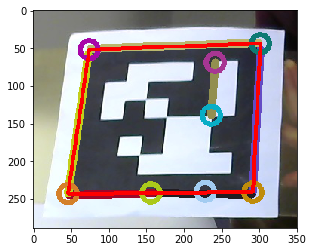

36
[array([292.54974, 244.51714], dtype=float32), 491.0282257080078]
[array([302.78775,  42.88987], dtype=float32), 494.2384246826172]
[array([75.28863, 51.5322 ], dtype=float32), 498.0651123046875]
[array([237.29721, 139.31107], dtype=float32), 13.536917114257813]
[array([242.5088  ,  71.827415], dtype=float32), 13.536917114257813]
[array([ 70.60112, 247.57715], dtype=float32), 44.009402465820315]
[array([ 47.166473, 247.82208 ], dtype=float32), 450.8455413818359]


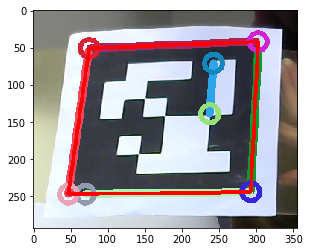

37
[array([278.90118, 272.26645], dtype=float32), 531.4520141601563]
[array([289.88733 ,  49.016487], dtype=float32), 519.2345947265625]
[array([64.65183 , 47.143665], dtype=float32), 521.6428741455078]
[array([225.9842 , 155.57234], dtype=float32), 12.742536163330078]
[array([229.7435  ,  91.970665], dtype=float32), 12.742536163330078]
[array([ 44.112125, 264.51697 ], dtype=float32), 533.8603240966797]


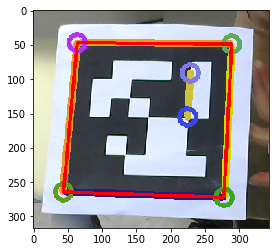

38
[array([288.1314 , 268.73154], dtype=float32), 534.4019500732421]
[array([281.091  ,  52.08241], dtype=float32), 348.44234771728514]
[array([200.5467  ,  55.049587], dtype=float32), 15.789097595214844]
[array([54.375687, 61.318996], dtype=float32), 254.03061]
[array([ 50.680244, 276.64587 ], dtype=float32), 490.7963012695313]
[array([225.08687, 156.89903], dtype=float32), 15.00872344970703]
[array([224.07835,  81.86219], dtype=float32), 15.00872344970703]
[array([53.679306, 99.33936 ], dtype=float32), 35.017022705078126]


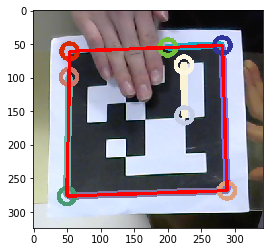

39
[array([287.54407, 265.06104], dtype=float32), 932.9510391235351]
[array([283.8914 , 153.16338], dtype=float32), 42.52616882324219]
[array([280.7985  ,  59.474026], dtype=float32), 232.8943878173828]
[array([180.36572, 268.92505], dtype=float32), 279.2488388061523]
[array([ 49.544586, 273.57956 ], dtype=float32), 718.608120727539]
[array([226.80927, 266.70938], dtype=float32), 207.70862]
[array([224.52293, 155.64769], dtype=float32), 15.012258911132813]
[array([222.97801 ,  80.602295], dtype=float32), 15.012258911132813]
[array([53.033318, 63.12342 ], dtype=float32), 41.76102905273437]
xxx
xxx
xxx


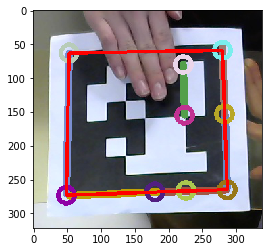

40
[array([324.6751 ,  73.71691], dtype=float32), 313.8040298461914]
[array([129.06657 ,  42.651825], dtype=float32), 331.8623992919922]
[array([281.2395  , 127.435646], dtype=float32), 340.9264144897461]
[array([61.742157, 95.04121 ], dtype=float32), 358.98475341796876]


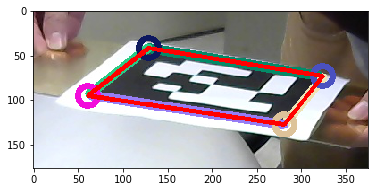

41
[array([319.97086,  70.73023], dtype=float32), 319.28097076416014]
[array([124.37466 ,  42.588833], dtype=float32), 336.4412811279297]
[array([274.66223, 140.85614], dtype=float32), 354.70492095947264]
[array([ 56.38903 , 109.750694], dtype=float32), 371.8652313232422]


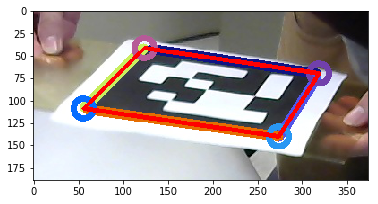

42
[array([318.07278,  68.08308], dtype=float32), 321.6996856689453]
[array([120.97219,  43.77675], dtype=float32), 336.08448486328126]
[array([279.38235, 134.8634 ], dtype=float32), 352.41430358886714]
[array([ 57.847797, 105.2686  ], dtype=float32), 366.799072265625]


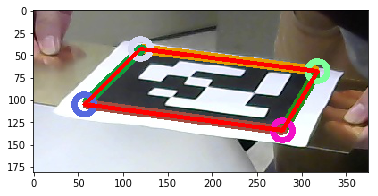

43
[array([300.7725 , 264.31937], dtype=float32), 463.9548828125]
[array([313.60254 ,  64.485916], dtype=float32), 39.81248779296875]
[array([315.21906,  39.30748], dtype=float32), 317.83356]
[array([ 45.642418, 259.1514  ], dtype=float32), 523.6029418945312]
[array([273.15988, 263.87878], dtype=float32), 45.0159912109375]
[array([196.83037 ,  42.907227], dtype=float32), 23.7542236328125]
[array([76.572586, 46.720192], dtype=float32), 396.03233642578124]


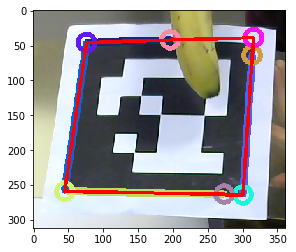

44
[array([260.4908 , 206.29561], dtype=float32), 433.17714843749997]
[array([308.77698 ,  59.711887], dtype=float32), 413.25299987792965]
[array([111.46628,  47.06132], dtype=float32), 416.7806396484375]
[array([ 48.58253, 188.46964], dtype=float32), 436.7047882080078]


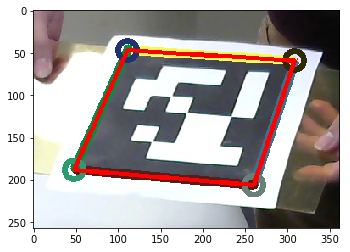

45
[array([191.6217 , 173.94035], dtype=float32), 15.040473937988281]
[array([212.5096 , 101.69707], dtype=float32), 15.040473937988281]
[array([220.77419,  79.88127], dtype=float32), 249.47115783691407]
[array([86.33451, 47.37004], dtype=float32), 393.31340637207035]
[array([ 37.45146, 229.20416], dtype=float32), 432.99609680175786]
[array([207.02608, 283.9049 ], dtype=float32), 35.65857849121094]


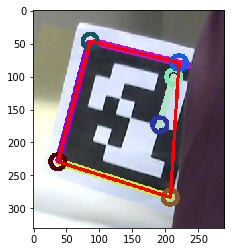

46
[array([273.86832, 272.1845 ], dtype=float32), 534.9273223876953]
[array([288.76932,  49.66861], dtype=float32), 718.4101608276367]
[array([178.13647 ,  49.598373], dtype=float32), 44.00387268066406]
[array([63.430275, 50.04003 ], dtype=float32), 707.4675918579101]
[array([222.70122, 156.84297], dtype=float32), 15.5501220703125]
[array([228.55939,  79.31337], dtype=float32), 15.5501220703125]
[array([230.89592 ,  48.390755], dtype=float32), 190.27267]
[array([ 39.994263, 263.9316  ], dtype=float32), 528.4105224609375]


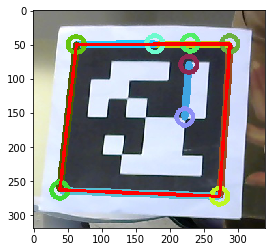

47
[array([245.71953 ,  59.604515], dtype=float32), 34.4498779296875]
[array([69.193794, 43.893707], dtype=float32), 437.4999755859375]
[array([195.80177, 159.20747], dtype=float32), 14.712083435058593]
[array([207.14722 ,  86.527245], dtype=float32), 14.712083435058593]
[array([ 40.63434, 242.73326], dtype=float32), 451.0103790283203]
[array([225.82608, 270.52646], dtype=float32), 36.70161437988281]


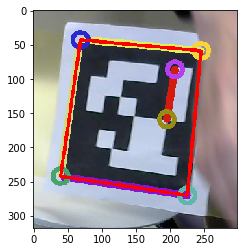

48
[array([262.23227, 172.40356], dtype=float32), 390.41601715087893]
[array([297.89447 ,  64.380615], dtype=float32), 366.54481048583983]
[array([99.6806  , 45.084206], dtype=float32), 378.68605957031247]
[array([ 42.89214, 154.39679], dtype=float32), 402.5572967529297]


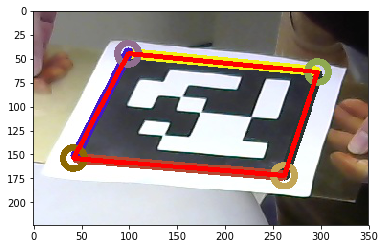

49
[array([289.96338, 251.62738], dtype=float32), 511.9431854248047]
[array([304.3475 ,  49.12511], dtype=float32), 427.9097900390625]
[array([130.62082,  48.46827], dtype=float32), 34.25193786621094]
[array([75.96212 , 49.256554], dtype=float32), 405.76881103515626]
[array([236.50262, 143.20914], dtype=float32), 13.854249572753906]
[array([243.11293,  74.25401], dtype=float32), 13.854249572753906]
[array([ 43.522907, 249.21437 ], dtype=float32), 524.0541137695312]


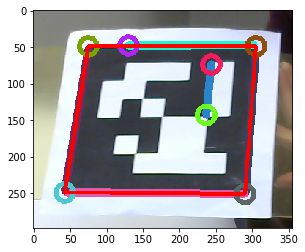

50
[array([283.54083, 213.13818], dtype=float32), 28.50434265136719]
[array([281.2874 ,  70.63429], dtype=float32), 28.50434265136719]
[array([284.13083, 258.04034], dtype=float32), 423.3172271728516]
[array([279.30524 ,  39.093292], dtype=float32), 396.4643310546875]
[array([ 47.948605, 265.99783 ], dtype=float32), 447.15032653808595]
[array([53.39794 , 53.312145], dtype=float32), 453.5683624267578]
[array([223.15788, 146.89255], dtype=float32), 15.0092529296875]
[array([222.07626,  71.85408], dtype=float32), 15.0092529296875]
[array([ 48.873123, 223.1439  ], dtype=float32), 33.27096252441406]


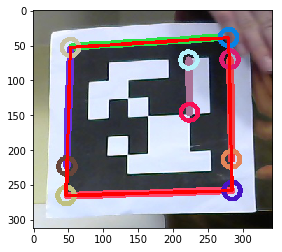

51
[array([280.27985, 267.43494], dtype=float32), 734.174951171875]
[array([278.84222, 203.14775], dtype=float32), 42.51728210449219]
[array([274.9864 ,  50.98686], dtype=float32), 421.5881118774414]
[array([ 42.667713, 273.8464  ], dtype=float32), 444.2436767578125]
[array([190.59149 ,  53.169193], dtype=float32), 16.271507263183594]
[array([47.607838, 57.14257 ], dtype=float32), 220.15771]
[array([218.56544, 156.88438], dtype=float32), 14.757705688476562]
[array([217.7097 ,  83.10082], dtype=float32), 14.757705688476562]
[array([ 45.756172, 133.15865 ], dtype=float32), 27.7600341796875]


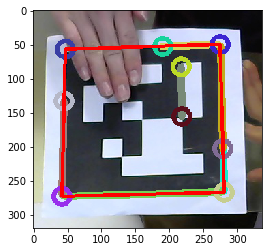

52
[array([280.3743  , 112.647606], dtype=float32), 334.4186668395996]
[array([317.2071 ,  68.50514], dtype=float32), 235.59150314331055]
[array([289.3734 ,  64.38539], dtype=float32), 32.559716796875]
[array([121.69671,  38.76925], dtype=float32), 279.47625732421875]
[array([58.4923  , 77.602684], dtype=float32), 345.7437042236328]


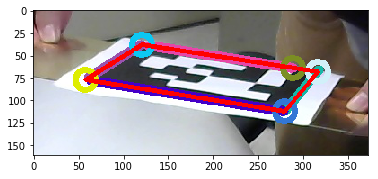

53
[array([285.97824, 268.57367], dtype=float32), 766.6646850585938]
[array([284.948  , 133.13838], dtype=float32), 44.002540588378906]
[array([284.01962 ,  44.806053], dtype=float32), 952.7462020874024]
[array([53.184494, 52.895767], dtype=float32), 528.4482452392579]
[array([ 47.075153, 272.21295 ], dtype=float32), 541.7745849609375]


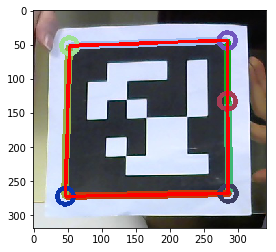

54
[array([279.59802, 266.23984], dtype=float32), 694.9330963134765]
[array([297.50717 ,  48.295177], dtype=float32), 515.6582153320312]
[array([218.53607, 263.72818], dtype=float32), 435.34918212890625]
[array([ 44.040585, 256.32358 ], dtype=float32), 725.329345703125]
[array([71.689705, 45.026382], dtype=float32), 521.181005859375]
[array([229.74509, 151.79187], dtype=float32), 16.04664001464844]
[array([237.29195,  71.91439], dtype=float32), 16.04664001464844]


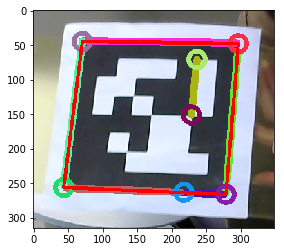

55
[array([222.53131, 278.45435], dtype=float32), 319.8988006591797]
[array([239.8725 , 195.46974], dtype=float32), 16.326663208007812]
[array([264.86905,  74.31166], dtype=float32), 223.4268]
[array([196.85045, 166.86957], dtype=float32), 13.639120483398438]
[array([211.56145, 100.27958], dtype=float32), 13.639120483398438]
[array([219.96024,  66.79253], dtype=float32), 238.34778747558593]
[array([ 39.33989, 235.42076], dtype=float32), 454.09489746093755]
[array([80.6807 , 43.43859], dtype=float32), 402.30827636718755]


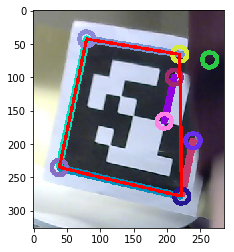

56
[array([288.98083, 248.0463 ], dtype=float32), 388.4784393310547]
[array([299.94458 ,  47.330242], dtype=float32), 443.0297576904297]
[array([124.35755,  49.25434], dtype=float32), 34.5099365234375]
[array([72.9638  , 50.441933], dtype=float32), 404.8402465820312]
[array([234.45985, 141.8815 ], dtype=float32), 13.536941528320312]
[array([239.6317 ,  74.39468], dtype=float32), 13.536941528320312]
[array([100.62275, 247.47571], dtype=float32), 30.50166015625]
[array([253.12997, 248.04626], dtype=float32), 30.50166015625]
[array([ 44.441242, 247.24577 ], dtype=float32), 384.7988647460937]


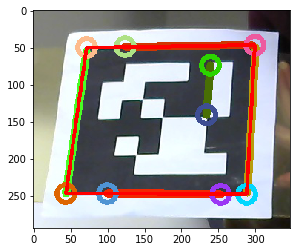

57
[array([254.08864, 217.6398 ], dtype=float32), 439.99241027832034]
[array([302.70047,  59.74168], dtype=float32), 423.1751953125]
[array([105.38673 ,  48.228157], dtype=float32), 421.14349365234375]
[array([ 45.132763, 201.2438  ], dtype=float32), 437.9607391357422]


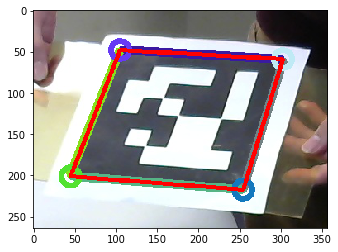

58
[array([292.40988, 250.01044], dtype=float32), 680.3417358398438]
[array([311.64172 ,  38.998383], dtype=float32), 333.94801940917966]
[array([185.40771, 249.25298], dtype=float32), 292.5769958496094]
[array([ 43.58696, 248.40543], dtype=float32), 717.8013641357421]
[array([185.69408 ,  42.132835], dtype=float32), 21.023760986328124]
[array([79.25471 , 47.386932], dtype=float32), 367.3598175048828]


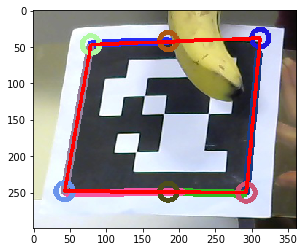

59
[array([196.51079, 286.48102], dtype=float32), 405.6884002685547]
[array([250.58311, 120.20509], dtype=float32), 34.552239990234376]
[array([258.96536,  94.41657], dtype=float32), 286.2454]
[array([186.18073, 175.40205], dtype=float32), 13.914918518066406]
[array([207.45276 , 109.159134], dtype=float32), 13.914918518066406]
[array([215.04933,  82.1466 ], dtype=float32), 205.7556137084961]
[array([ 38.675667, 229.75847 ], dtype=float32), 419.9336059570312]
[array([95.02353, 48.87784], dtype=float32), 357.73967437744136]


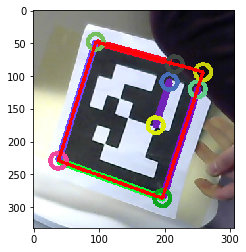

60
[array([240.78517, 267.72916], dtype=float32), 466.0540313720703]
[array([270.387  ,  56.23399], dtype=float32), 329.3063232421875]
[array([231.25769, 160.86215], dtype=float32), 16.15575256347656]
[array([241.35294,  80.71669], dtype=float32), 16.15575256347656]
[array([218.14728, 264.9447 ], dtype=float32), 268.86285]
[array([193.06618,  47.50726], dtype=float32), 14.825531005859375]
[array([73.756516, 36.407276], dtype=float32), 239.2372]
[array([205.49236, 155.77786], dtype=float32), 15.200430297851563]
[array([215.79385,  80.4771 ], dtype=float32), 15.200430297851563]
[array([ 50.105484, 242.54636 ], dtype=float32), 423.8323608398438]
[array([69.05208 , 76.691315], dtype=float32), 33.021908569335935]
xxx


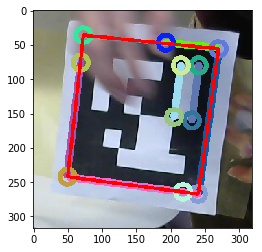

61
[array([289.7875 , 283.80975], dtype=float32), 679.8126708984374]
[array([288.73196, 213.13925], dtype=float32), 46.25742797851562]
[array([286.38977 ,  45.935642], dtype=float32), 970.6748046875]
[array([ 90.60888, 288.7153 ], dtype=float32), 39.524853515625]
[array([ 48.03801, 289.47617], dtype=float32), 473.63353271484374]
[array([222.80952 ,  47.996826], dtype=float32), 281.0830841064453]
[array([342.08575,  43.89591], dtype=float32), 230.16037]
[array([49.032578, 53.958275], dtype=float32), 766.9349304199219]
[array([226.61095, 164.38052], dtype=float32), 16.252627563476562]
[array([226.31464,  83.11793], dtype=float32), 16.252627563476562]


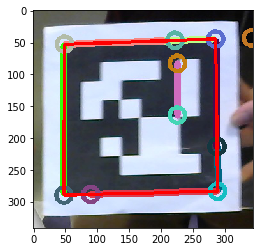

62
[array([277.61197, 261.8644 ], dtype=float32), 470.67473754882815]
[array([274.54874 ,  43.079437], dtype=float32), 439.71225891113284]
[array([120.593414,  46.9524  ], dtype=float32), 30.272689819335938]
[array([44.95871 , 48.989864], dtype=float32), 283.97583]
[array([ 39.928127, 266.02805 ], dtype=float32), 414.25319519042966]
[array([254.40587, 262.39212], dtype=float32), 42.519717407226565]
[array([216.42415, 149.37596], dtype=float32), 15.00042266845703]
[array([216.3818 ,  74.37386], dtype=float32), 15.00042266845703]
[array([ 42.95482, 131.84065], dtype=float32), 26.522479248046874]


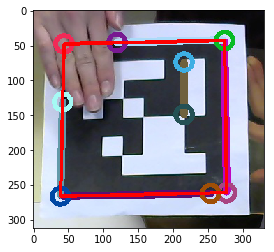

63
[array([289.40594, 266.742  ], dtype=float32), 539.2424591064453]
[array([278.85684,  46.36025], dtype=float32), 524.6288452148438]
[array([ 50.702744, 277.3282  ], dtype=float32), 532.8459991455078]
[array([51.955635, 61.541153], dtype=float32), 518.2323852539063]


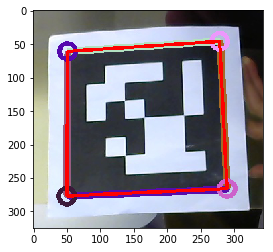

64
[array([266.63876, 160.43283], dtype=float32), 373.55665130615233]
[array([302.65213,  64.80855], dtype=float32), 347.5794052124024]
[array([104.97906,  45.74028], dtype=float32), 358.67281341552734]
[array([ 46.175266, 138.28035 ], dtype=float32), 384.6500595092773]


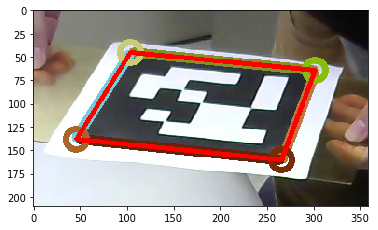

65
[array([288.9005, 266.6137], dtype=float32), 533.0799285888672]
[array([280.72458 ,  43.607613], dtype=float32), 315.0836120605469]
[array([ 50.777336, 275.40005 ], dtype=float32), 529.8966796875001]
[array([119.2893  ,  57.219093], dtype=float32), 12.562165069580079]
[array([54.138412, 63.6645  ], dtype=float32), 324.4625587463379]


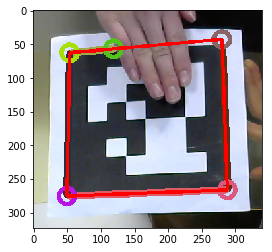

66
[array([277.21222, 260.81668], dtype=float32), 733.6364868164062]
[array([274.23846 ,  44.138725], dtype=float32), 418.658349609375]
[array([105.36682, 263.30255], dtype=float32), 404.02336807250975]
[array([ 39.464226, 264.23578 ], dtype=float32), 592.3778129577637]
[array([134.35912 ,  47.523403], dtype=float32), 27.516812133789063]
[array([46.142437, 49.852066], dtype=float32), 295.2418]
[array([21.532139, 50.348007], dtype=float32), 211.67781600952148]
[array([216.44417, 261.39542], dtype=float32), 133.7644]
[array([216.41078, 149.37552], dtype=float32), 15.000225830078126]
[array([216.38841,  74.3744 ], dtype=float32), 15.000225830078126]
[array([ 44.28502, 107.43009], dtype=float32), 263.28303146362305]
xxx


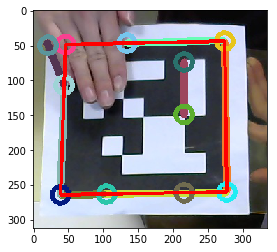

67
[array([296.4164 , 268.87527], dtype=float32), 457.63771057128906]
[array([310.77872 ,  46.505596], dtype=float32), 657.5805465698243]
[array([249.3486  ,  46.810974], dtype=float32), 333.9115707397461]
[array([208.44142,  47.34723], dtype=float32), 167.67981]
[array([73.31991, 49.59029], dtype=float32), 652.1574432373047]
[array([240.74892, 153.23988], dtype=float32), 15.321954345703125]
[array([247.13272,  76.89655], dtype=float32), 15.321954345703125]
[array([232.61667, 268.6275 ], dtype=float32), 313.6298065185547]
[array([ 43.875626, 267.3831  ], dtype=float32), 490.0858184814453]
[array([176.8958  ,  48.634705], dtype=float32), 20.523727416992188]


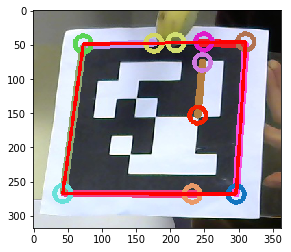

68
[array([157.9562 , 187.62645], dtype=float32), 10.619568634033204]
[array([210.80836, 182.52443], dtype=float32), 10.619568634033204]
[array([128.59833,  92.84834], dtype=float32), 12.218962097167969]
[array([97.76852, 40.10274], dtype=float32), 12.218962097167969]
[array([52.26538, 89.45574], dtype=float32), 10.307647705078125]
[array([ 10.741316, 119.983475], dtype=float32), 10.307647705078125]


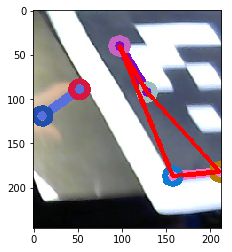

69
[array([188.94931, 179.22302], dtype=float32), 14.866067504882812]
[array([213.94153 , 109.220245], dtype=float32), 14.866067504882812]
[array([223.89926 ,  87.505264], dtype=float32), 250.7381378173828]
[array([96.103226, 46.997707], dtype=float32), 392.70794677734375]
[array([ 37.07638, 224.36403], dtype=float32), 417.4138214111328]
[array([195.84354, 288.8342 ], dtype=float32), 33.51894836425781]


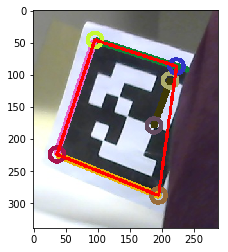

70
[array([269.2235 , 259.10962], dtype=float32), 718.4428619384765]
[array([273.74622, 128.1684 ], dtype=float32), 41.04361572265625]
[array([276.41434,  48.47176], dtype=float32), 686.8377197265625]
[array([61.01422, 64.9658 ], dtype=float32), 492.4156463623047]
[array([ 43.853703, 268.29828 ], dtype=float32), 503.9468994140625]
[array([216.2628 , 153.09526], dtype=float32), 15.018721008300782]
[array([219.90553,  78.09006], dtype=float32), 15.018721008300782]


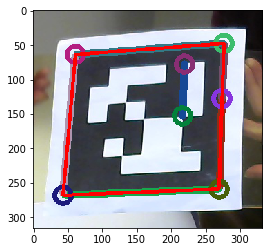

71
[array([286.7256 , 251.17847], dtype=float32), 430.29616699218747]
[array([301.3077, 135.5541], dtype=float32), 23.19449462890625]
[array([313.17435 ,  40.611282], dtype=float32), 214.79335]
[array([ 42.10307, 245.50752], dtype=float32), 525.0877807617187]
[array([186.90047 ,  45.092445], dtype=float32), 19.764175415039062]
[array([85.65775 , 49.178596], dtype=float32), 352.5436492919922]


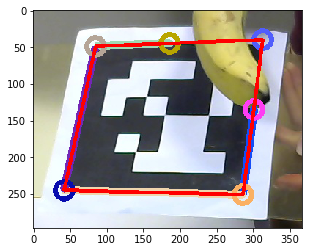

72
[array([273.66415, 258.65106], dtype=float32), 512.2758544921875]
[array([285.84534 ,  50.702972], dtype=float32), 500.4814422607422]
[array([66.21354 , 59.900005], dtype=float32), 496.7039825439453]
[array([222.42252, 151.91428], dtype=float32), 14.552273559570313]
[array([227.6284 ,  79.33938], dtype=float32), 14.552273559570313]
[array([ 45.499573, 263.74896 ], dtype=float32), 508.49842529296876]


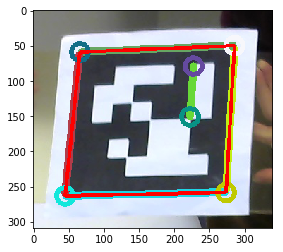

73
[array([286.6245, 266.8586], dtype=float32), 540.5358428955078]
[array([277.38037 ,  47.280033], dtype=float32), 437.2968994140625]
[array([ 48.092396, 276.03574 ], dtype=float32), 535.7319580078125]
[array([222.7723 , 154.42964], dtype=float32), 15.025364685058594]
[array([220.21222,  79.34645], dtype=float32), 15.025364685058594]
[array([220.61409 ,  50.229706], dtype=float32), 289.8742431640625]
[array([50.71022, 60.41345], dtype=float32), 468.28424987792965]


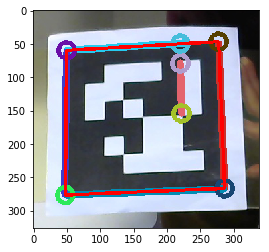

74
[array([295.68713, 290.25574], dtype=float32), 772.2273010253906]
[array([293.78784, 176.89758], dtype=float32), 46.01047210693359]
[array([291.45877 ,  54.562214], dtype=float32), 763.2813247680664]
[array([ 54.517483, 297.104   ], dtype=float32), 556.7310791015625]
[array([54.799217, 64.40546 ], dtype=float32), 550.7610321044922]
[array([232.62897, 170.65001], dtype=float32), 16.50904998779297]
[array([231.44658,  88.11323], dtype=float32), 16.50904998779297]


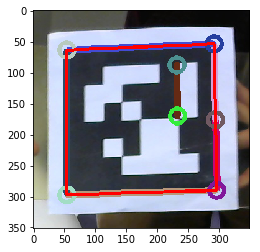

75
[array([265.34393, 163.62103], dtype=float32), 382.13880462646483]
[array([301.02933,  65.02875], dtype=float32), 352.31238861083983]
[array([103.36487 ,  44.720284], dtype=float32), 360.5993377685547]
[array([ 45.252815, 144.33923 ], dtype=float32), 390.4257537841797]


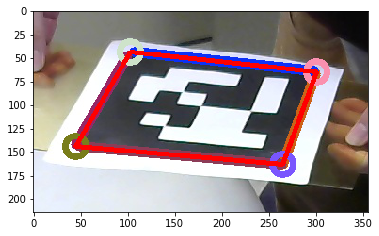

76
[array([300.42267, 269.28836], dtype=float32), 634.1381072998047]
[array([304.62903, 123.15489], dtype=float32), 44.019467163085935]
[array([306.72617,  46.16381], dtype=float32), 625.7152465820312]
[array([125.61158,  48.22006], dtype=float32), 35.50922546386719]
[array([69.56635 , 49.288578], dtype=float32), 435.61924133300784]
[array([240.91599, 153.07698], dtype=float32), 15.767799377441406]
[array([244.85875,  74.33663], dtype=float32), 15.767799377441406]
[array([ 76.868225, 268.01556 ], dtype=float32), 38.50377502441406]
[array([269.3837 , 269.15973], dtype=float32), 38.50377502441406]
[array([ 46.717415, 267.7563  ], dtype=float32), 450.5919891357422]


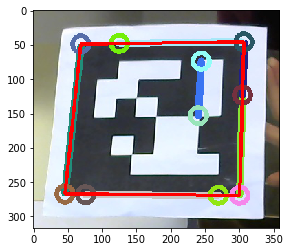

77
[array([294.8322 , 266.77832], dtype=float32), 750.610595703125]
[array([310.40155 ,  43.417603], dtype=float32), 367.6109100341797]
[array([149.40442, 264.73505], dtype=float32), 49.503431701660155]
[array([ 43.287964, 263.22635 ], dtype=float32), 727.5592544555664]
[array([240.1975 , 150.58453], dtype=float32), 14.825715637207031]
[array([247.1834  ,  76.785866], dtype=float32), 14.825715637207031]
[array([229.42247, 264.41113], dtype=float32), 177.87946]
[array([250.29141,  43.95283], dtype=float32), 183.00848]
[array([184.41243,  45.74818], dtype=float32), 21.775982666015626]
[array([73.56985 , 49.489902], dtype=float32), 381.1787811279297]


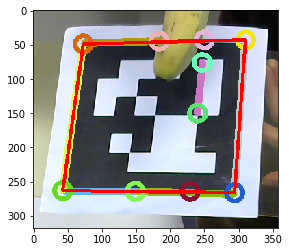

78
[array([218.47058,  79.64542], dtype=float32), 24.753457641601564]
[array([100.29324,  37.96007], dtype=float32), 376.74631042480473]
[array([ 36.983387, 219.07738 ], dtype=float32), 415.14441223144536]
[array([182.84116, 281.29236], dtype=float32), 31.15314636230469]


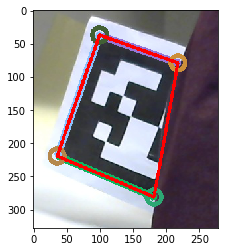

79
[array([274.72424, 262.24506], dtype=float32), 538.6409179687499]
[array([271.41083,  41.06348], dtype=float32), 423.23144226074214]
[array([130.59935 ,  44.731323], dtype=float32), 27.524542236328124]
[array([40.740154, 47.310448], dtype=float32), 232.68515]
[array([ 35.830067, 265.73495 ], dtype=float32), 394.6316543579102]
[array([213.30406, 146.87521], dtype=float32), 15.0000732421875]
[array([213.31496,  71.87485], dtype=float32), 15.0000732421875]
[array([ 37.856064, 168.11858 ], dtype=float32), 19.012486267089844]


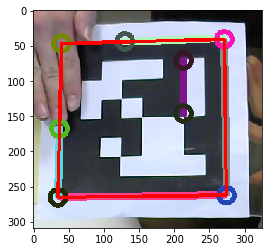

80
[array([284.18448, 268.37363], dtype=float32), 543.1356475830078]
[array([282.0659  ,  44.741447], dtype=float32), 534.1789276123047]
[array([51.870224, 51.84323 ], dtype=float32), 529.803076171875]
[array([ 45.254684, 272.05045 ], dtype=float32), 538.7598266601562]
[array([223.31029, 154.37498], dtype=float32), 15.500001525878906]
[array([223.31186,  76.87498], dtype=float32), 15.500001525878906]


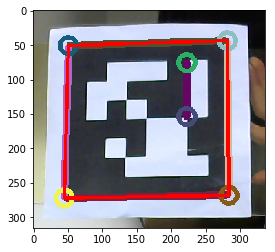

81
[array([277.32254, 260.9607 ], dtype=float32), 740.9210113525392]
[array([283.67532, 113.18402], dtype=float32), 41.04119338989258]
[array([286.35602,  49.54952], dtype=float32), 610.8411506652833]
[array([105.561264,  58.03128 ], dtype=float32), 35.8046142578125]
[array([63.00588 , 60.577335], dtype=float32), 421.70677490234374]
[array([ 44.039425, 268.93512 ], dtype=float32), 518.9336456298828]
[array([223.32927, 151.88608], dtype=float32), 14.532879638671876]
[array([227.26591,  79.32839], dtype=float32), 14.532879638671876]


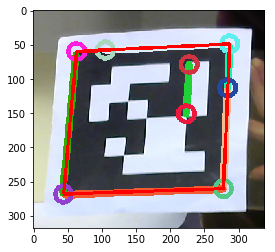

82
[array([284.22366, 266.30167], dtype=float32), 667.382470703125]
[array([281.72388 ,  79.394424], dtype=float32), 37.253350830078126]
[array([281.1262 ,  44.09491], dtype=float32), 616.7123809814453]
[array([167.99112, 268.52353], dtype=float32), 279.108544921875]
[array([ 45.792076, 270.76404 ], dtype=float32), 700.0624176025391]
[array([171.25302,  48.48187], dtype=float32), 267.18885498046876]
[array([52.288258, 54.001507], dtype=float32), 691.6264526367188]
[array([222.32942, 266.85596], dtype=float32), 181.31528]
[array([222.34836, 151.87529], dtype=float32), 14.750123596191406]
[array([222.3605 ,  78.12467], dtype=float32), 14.750123596191406]
[array([222.36575 ,  46.106174], dtype=float32), 188.80069]


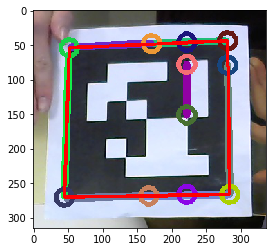

83
[array([288.07852, 267.26355], dtype=float32), 735.6906250000001]
[array([277.4494  ,  48.470505], dtype=float32), 522.9551513671875]
[array([125.56229, 274.59808], dtype=float32), 46.552406311035156]
[array([ 49.42376, 278.03546], dtype=float32), 646.1074356079101]
[array([227.24672, 269.27206], dtype=float32), 148.97089]
[array([51.288765, 62.035355], dtype=float32), 447.38775024414065]
[array([223.43243, 155.65665], dtype=float32), 15.27496795654297]
[array([220.86986 ,  79.324814], dtype=float32), 15.27496795654297]
[array([50.822144, 95.60629 ], dtype=float32), 36.256927490234375]


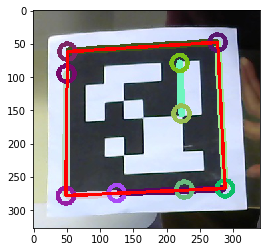

84
[array([283.67465, 213.1493 ], dtype=float32), 32.78232116699219]
[array([277.66006,  46.00782], dtype=float32), 464.10999755859376]
[array([285.17627, 263.97992], dtype=float32), 589.9936004638672]
[array([120.57362, 269.44876], dtype=float32), 46.029771423339845]
[array([ 47.284092, 272.01062 ], dtype=float32), 709.0281661987304]
[array([51.135345, 57.284733], dtype=float32), 520.9821166992188]
[array([224.06395, 265.27585], dtype=float32), 143.86815]
[array([222.05348, 151.91617], dtype=float32), 14.765412902832031]
[array([220.74437 ,  78.100716], dtype=float32), 14.765412902832031]


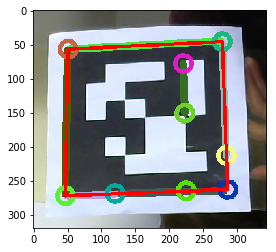

85
[array([288.2556 , 282.48566], dtype=float32), 480.36522216796874]
[array([282.19788,  49.78035], dtype=float32), 546.6603546142578]
[array([110.60141, 288.65924], dtype=float32), 35.030416870117186]
[array([ 48.491524, 290.5714  ], dtype=float32), 445.16550903320314]
[array([47.354767, 61.226604], dtype=float32), 546.4910888671875]
[array([224.5941 , 166.89542], dtype=float32), 16.511614990234374]
[array([222.95964,  84.35352], dtype=float32), 16.511614990234374]


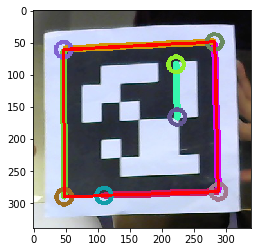

86
[array([ 38.954105, 219.91977 ], dtype=float32), 387.90021667480465]
[array([167.53204, 273.311  ], dtype=float32), 27.25066223144531]
[array([204.60918 ,  74.921295], dtype=float32), 21.266036987304688]
[array([100.87111 ,  40.432415], dtype=float32), 351.9924346923828]


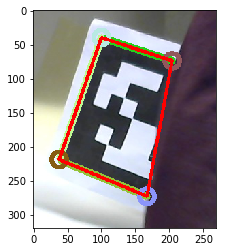

87
[array([238.84256, 261.72018], dtype=float32), 469.9702850341797]
[array([266.42114,  53.3232 ], dtype=float32), 451.0238891601563]
[array([ 86.85526, 293.2306 ], dtype=float32), 14.558612060546874]
[array([158.40903, 306.6055 ], dtype=float32), 14.558612060546874]
[array([182.27083, 311.06577], dtype=float32), 144.73828]
[array([ 42.79595, 284.99493], dtype=float32), 267.0628]
[array([74.37476 , 46.167187], dtype=float32), 437.4314178466797]
[array([203.10667, 151.8726 ], dtype=float32), 14.389045715332031]
[array([212.44353 ,  80.535805], dtype=float32), 14.389045715332031]
[array([ 48.165234, 244.72116 ], dtype=float32), 456.37778320312503]


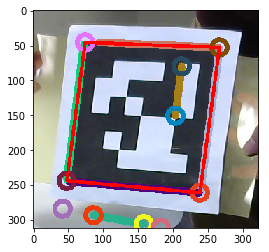

88
[array([278.5275, 269.7137], dtype=float32), 437.0363494873047]
[array([286.19254,  48.75711], dtype=float32), 717.3668853759766]
[array([133.982   ,  53.873337], dtype=float32), 258.13884887695315]
[array([62.217545, 56.672047], dtype=float32), 693.9841033935547]
[array([ 41.964157, 271.22177 ], dtype=float32), 467.95041809082034]
[array([218.65968, 270.16504], dtype=float32), 290.9296569824219]
[array([223.72786, 154.40465], dtype=float32), 15.280712890625]
[array([227.48167,  78.09335], dtype=float32), 15.280712890625]
[array([228.90903,  49.07653], dtype=float32), 147.68901]


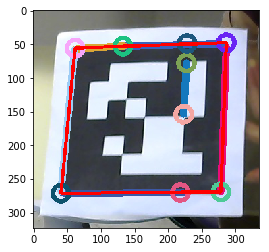

89
[array([286.57666, 266.84183], dtype=float32), 498.42890625]
[array([279.21072 ,  54.380848], dtype=float32), 42.28551025390625]
[array([ 80.56881, 273.978  ], dtype=float32), 40.78597412109375]
[array([ 48.68706, 275.01398], dtype=float32), 632.4118713378906]
[array([221.99864, 156.7985 ], dtype=float32), 15.033283996582032]
[array([227.0926 ,  81.80488], dtype=float32), 15.033283996582032]
[array([ 49.99972, 188.14188], dtype=float32), 41.51005859375]
[array([51.921917, 65.60779 ], dtype=float32), 24.508221435546876]


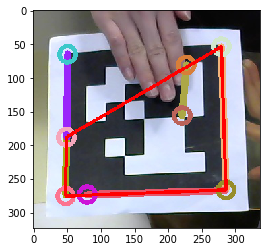

90
[array([300.8548, 271.3211], dtype=float32), 704.8134887695313]
[array([309.024  ,  46.94143], dtype=float32), 543.4147735595703]
[array([208.6637, 270.7015], dtype=float32), 41.01279144287109]
[array([ 44.767178, 269.53476 ], dtype=float32), 675.7745391845704]
[array([69.01186, 51.43891], dtype=float32), 537.4003784179688]
[array([ 93.12396, 270.47656], dtype=float32), 23.000291442871095]
[array([235.17862, 270.42093], dtype=float32), 175.04898]
[array([241.50827, 153.17268], dtype=float32), 12.009503936767578]
[array([244.74522,  93.21247], dtype=float32), 12.009503936767578]


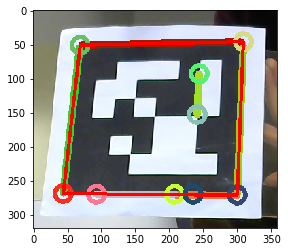

91
[array([284.1895 , 223.14572], dtype=float32), 27.507958984375]
[array([282.20383 ,  85.620255], dtype=float32), 27.507958984375]
[array([284.62952, 256.0807 ], dtype=float32), 416.7913787841797]
[array([281.50024,  36.89332], dtype=float32), 325.45593]
[array([ 48.685524, 264.51587 ], dtype=float32), 529.9026092529297]
[array([223.31458, 145.62506], dtype=float32), 15.000027465820313]
[array([223.31065,  70.62492], dtype=float32), 15.000027465820313]
[array([225.78833,  40.65274], dtype=float32), 300.4994873046875]
[array([54.180008, 52.41884 ], dtype=float32), 476.150390625]


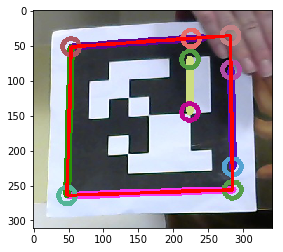

92
[array([289.1395, 258.9739], dtype=float32), 444.501708984375]
[array([283.60175, 121.95858], dtype=float32), 27.01826171875]
[array([280.07907,  36.68084], dtype=float32), 256.64496]
[array([ 51.348892, 269.97623 ], dtype=float32), 534.4184692382812]
[array([175.6292  ,  45.673786], dtype=float32), 24.31072998046875]
[array([52.8669 , 56.44066], dtype=float32), 397.8907104492188]


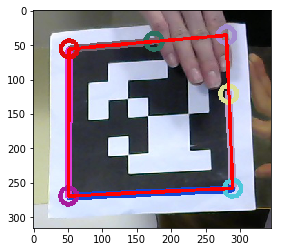

93
[array([285.69797, 248.17188], dtype=float32), 449.8277160644531]
[array([308.78937 ,  37.915554], dtype=float32), 362.46397705078124]
[array([ 37.935593, 245.77547 ], dtype=float32), 483.3523681640625]
[array([241.88994, 247.69002], dtype=float32), 40.502838134765625]
[array([194.3967 ,  41.22757], dtype=float32), 23.030087280273438]
[array([77.16871, 45.72392], dtype=float32), 378.51584777832034]


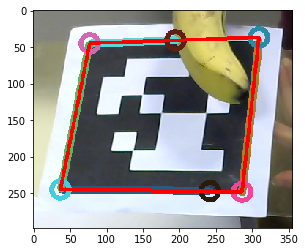

94
[array([303.66772, 271.13458], dtype=float32), 568.5761749267579]
[array([308.93036 ,  43.038643], dtype=float32), 474.7692810058594]
[array([242.82271, 153.11302], dtype=float32), 16.01714630126953]
[array([245.99248,  73.09004], dtype=float32), 16.01714630126953]
[array([247.12799,  44.42365], dtype=float32), 287.78766]
[array([278.17267 ,  43.529285], dtype=float32), 41.540383911132814]
[array([67.86976 , 49.881985], dtype=float32), 510.1219451904297]
[array([ 47.56153, 272.0015 ], dtype=float32), 562.3884552001954]


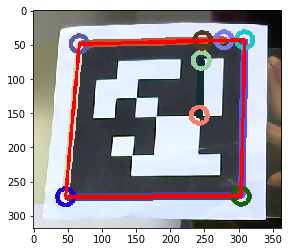

95
[array([319.21844,  70.94152], dtype=float32), 293.82229537963866]
[array([124.48333,  43.10508], dtype=float32), 310.59301910400393]
[array([283.35886, 123.90391], dtype=float32), 340.7077507019043]
[array([61.67578, 90.15517], dtype=float32), 357.4784896850586]


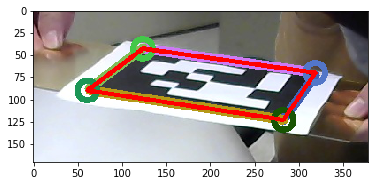

96
[array([264.62418, 168.66183], dtype=float32), 387.24828948974607]
[array([300.0617 ,  64.98682], dtype=float32), 360.3829818725586]
[array([101.86218 ,  44.671146], dtype=float32), 374.75606536865234]
[array([ 44.69966, 149.87035], dtype=float32), 401.6213729858398]


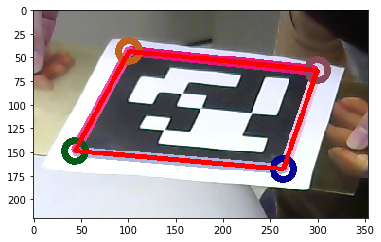

97
[array([288.3654, 250.1407], dtype=float32), 531.3740509033203]
[array([311.37814,  43.82327], dtype=float32), 434.70436401367186]
[array([276.89825,  44.17225], dtype=float32), 38.273870849609374]
[array([83.4183  , 48.766968], dtype=float32), 467.0429412841797]
[array([252.39442,  44.71629], dtype=float32), 259.4341]
[array([239.78125, 141.76534], dtype=float32), 13.61295166015625]
[array([248.55362,  74.26825], dtype=float32), 13.61295166015625]
[array([ 43.54293, 248.05495], dtype=float32), 525.4387573242187]


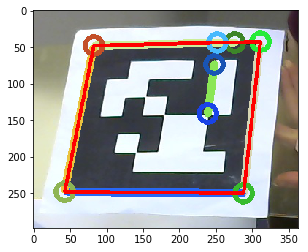

98
[array([195.85197, 170.68028], dtype=float32), 14.43060302734375]
[array([212.92534, 100.57638], dtype=float32), 14.43060302734375]
[array([221.36717,  73.01904], dtype=float32), 259.56622314453125]
[array([78.70771 , 43.680176], dtype=float32), 413.4006591796875]
[array([ 36.640396, 232.7707  ], dtype=float32), 444.2523956298828]
[array([213.99426, 280.78656], dtype=float32), 36.37749328613281]


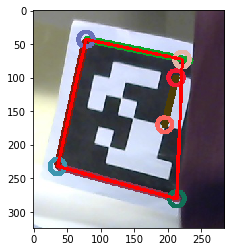

99
[array([287.23355, 267.0854 ], dtype=float32), 938.2469818115234]
[array([283.42807 ,  43.719353], dtype=float32), 529.8261840820312]
[array([223.77554, 267.6412 ], dtype=float32), 637.536473083496]
[array([ 46.47021, 267.34485], dtype=float32), 1348.5631103515625]
[array([135.60909, 268.67004], dtype=float32), 34.002752685546874]
[array([52.9643 , 50.57237], dtype=float32), 733.5889007568359]
[array([225.45207, 151.87521], dtype=float32), 15.500074768066407]
[array([225.44035,  74.37484], dtype=float32), 15.500074768066407]
[array([ 48.770256, 188.15701 ], dtype=float32), 42.77575531005859]
xxx


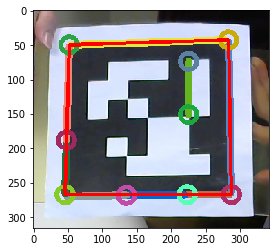

100
[array([283.10138, 266.74475], dtype=float32), 732.1715713500976]
[array([279.5075  ,  43.955025], dtype=float32), 724.2897933959961]
[array([188.58902, 268.3812 ], dtype=float32), 282.06771087646484]
[array([ 44.148125, 270.66428 ], dtype=float32), 645.9725677490235]
[array([153.2815 ,  48.80872], dtype=float32), 270.18565063476564]
[array([49.662373, 53.0668  ], dtype=float32), 597.0565139770508]
[array([221.418  , 267.43616], dtype=float32), 207.5548]
[array([221.4077 , 154.37505], dtype=float32), 15.750045776367188]
[array([221.40053,  75.62482], dtype=float32), 15.750045776367188]
[array([221.39777 ,  45.459705], dtype=float32), 187.55347]
[array([48.55739, 93.16787], dtype=float32), 35.01411437988281]


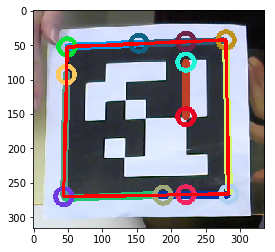

101
[array([259.27664, 220.74474], dtype=float32), 525.106721496582]
[array([289.24   ,  53.07786], dtype=float32), 316.53065185546876]
[array([204.35782, 218.83372], dtype=float32), 296.2596771240234]
[array([ 45.341995, 213.01416 ], dtype=float32), 511.79454040527344]
[array([189.3573  ,  52.150387], dtype=float32), 19.504388427734376]
[array([88.18852 , 51.545826], dtype=float32), 296.17991638183594]
[array([222.10085, 131.6746 ], dtype=float32), 11.915382385253906]
[array([233.54073 ,  73.206345], dtype=float32), 11.915382385253906]
[array([109.40262, 215.9117 ], dtype=float32), 17.757038879394532]
xxx


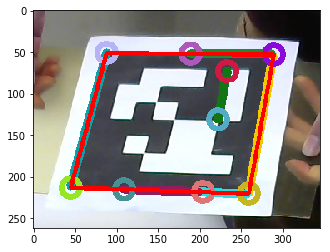

102
[array([288.62375, 256.3946 ], dtype=float32), 499.44600982666014]
[array([285.13065, 150.64194], dtype=float32), 21.013365173339842]
[array([281.20267,  35.99477], dtype=float32), 250.40863]
[array([115.57619, 263.53503], dtype=float32), 46.803549957275386]
[array([ 50.502266, 266.32425 ], dtype=float32), 705.9540657043457]
[array([226.22867, 257.97534], dtype=float32), 132.6169]
[array([225.6819 , 146.87473], dtype=float32), 14.00106201171875]
[array([225.33737,  76.87026], dtype=float32), 14.00106201171875]
[array([225.15686,  40.19798], dtype=float32), 215.34712]
[array([200.63715,  42.03686], dtype=float32), 29.068362426757812]
[array([54.077423, 53.27952 ], dtype=float32), 424.99962158203124]


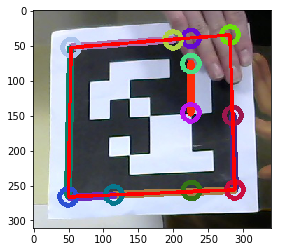

103
[array([276.97714, 258.46454], dtype=float32), 538.5766845703125]
[array([275.58524 ,  38.181427], dtype=float32), 454.64879150390624]
[array([109.34826 ,  42.046726], dtype=float32), 32.521002197265624]
[array([45.043266, 43.64156 ], dtype=float32), 232.64764]
[array([ 39.283382, 261.55673 ], dtype=float32), 363.10506439208984]
[array([216.36452, 144.3764 ], dtype=float32), 11.501404571533204]
[array([216.47383 ,  86.869484], dtype=float32), 11.501404571533204]
[array([ 40.93876, 189.41902], dtype=float32), 14.008525085449218]


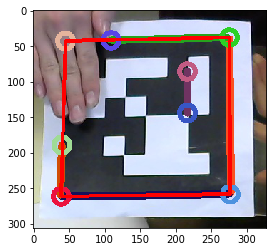

104
[array([267.404  , 257.90558], dtype=float32), 876.8033813476562]
[array([268.8676 , 198.14853], dtype=float32), 39.75895385742187]
[array([271.7613  ,  49.093136], dtype=float32), 692.9099517822266]
[array([115.580414, 263.6466  ], dtype=float32), 43.793984985351564]
[array([ 41.63166, 266.4817 ], dtype=float32), 672.1642791748046]
[array([57.784283, 63.51134 ], dtype=float32), 493.65307312011714]
[array([209.52467, 259.34033], dtype=float32), 145.19101]
[array([214.0338 , 153.11052], dtype=float32), 14.768536376953126]
[array([217.16537,  79.33427], dtype=float32), 14.768536376953126]


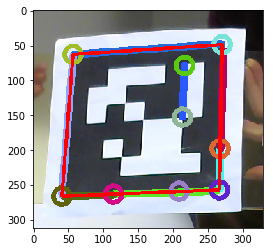

105
[array([278.2611 , 264.57343], dtype=float32), 507.1229370117187]
[array([275.3952  ,  46.495476], dtype=float32), 432.1537719726562]
[array([126.856384,  49.876858], dtype=float32), 29.265826416015624]
[array([46.83412, 51.86814], dtype=float32), 258.96207]
[array([ 65.60493, 268.12772], dtype=float32), 41.760687255859374]
[array([ 40.62331, 268.42383], dtype=float32), 343.96295776367185]
[array([217.30496, 153.12329], dtype=float32), 15.500485229492188]
[array([217.46616,  75.62103], dtype=float32), 15.500485229492188]
[array([ 43.895653, 154.32541 ], dtype=float32), 22.5265869140625]


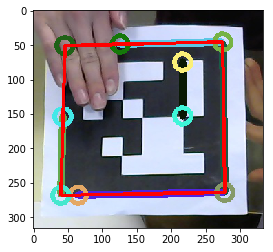

106
[array([265.29208, 202.18558], dtype=float32), 423.5373046875]
[array([299.50388 ,  60.556004], dtype=float32), 404.07513427734375]
[array([100.574234,  48.01053 ], dtype=float32), 411.0775604248047]
[array([ 49.73435, 188.95966], dtype=float32), 430.5397003173828]


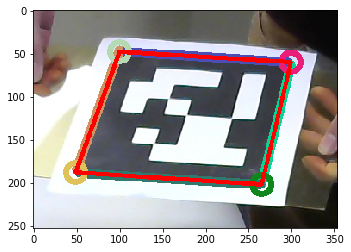

107
[array([282.3556 , 267.49673], dtype=float32), 596.4897399902344]
[array([278.93   , 148.15887], dtype=float32), 43.01832580566406]
[array([275.92017 ,  50.076912], dtype=float32), 482.1938003540039]
[array([ 45.134624, 275.21497 ], dtype=float32), 387.09986877441406]
[array([225.5435, 269.3628], dtype=float32), 35.76362609863281]
[array([159.33122 ,  54.487427], dtype=float32), 22.53142547607422]
[array([48.055683, 60.589348], dtype=float32), 319.67888793945315]
[array([ 45.35334, 248.1391 ], dtype=float32), 34.50362548828125]


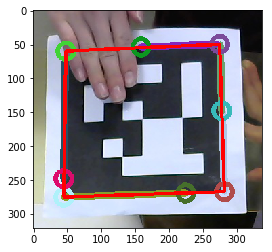

108
[array([273.7088 , 261.85468], dtype=float32), 487.610009765625]
[array([270.687  ,  41.89197], dtype=float32), 466.8365844726563]
[array([ 60.600433, 268.25156 ], dtype=float32), 42.26176147460937]
[array([ 36.27627, 268.75623], dtype=float32), 287.85638122558595]
[array([74.33053 , 49.548557], dtype=float32), 38.79952392578125]
[array([41.084797, 50.921963], dtype=float32), 257.7873]
[array([213.40298, 148.11972], dtype=float32), 14.506881713867188]
[array([212.0253,  75.5984], dtype=float32), 14.506881713867188]
[array([ 37.697037, 204.39314 ], dtype=float32), 12.757931518554688]


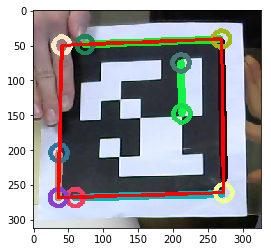

109
[array([294.88464, 250.96231], dtype=float32), 713.5381988525392]
[array([314.7423  ,  38.520966], dtype=float32), 315.09913940429686]
[array([150.25851, 249.30725], dtype=float32), 294.11184082031247]
[array([ 43.97514, 248.30284], dtype=float32), 705.2144622802734]
[array([158.18965 ,  44.420242], dtype=float32), 14.781510925292968]
[array([81.37643 , 48.808926], dtype=float32), 327.2507431030274]


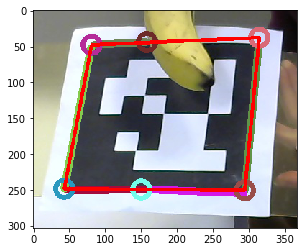

110
[array([245.71704, 234.73465], dtype=float32), 447.93281249999995]
[array([290.77737 ,  60.197872], dtype=float32), 436.78392333984374]
[array([95.39418 , 50.388622], dtype=float32), 433.23882141113285]
[array([217.7005 , 140.51039], dtype=float32), 11.336553955078125]
[array([232.4754,  85.7871], dtype=float32), 11.336553955078125]
[array([ 42.508907, 218.42587 ], dtype=float32), 444.3877410888672]


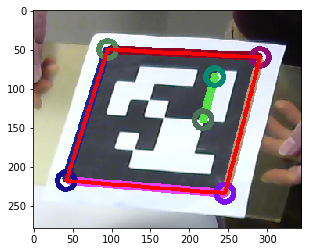

111
[array([238.74452, 268.54904], dtype=float32), 444.3889892578125]
[array([254.97827,  83.28575], dtype=float32), 36.601104736328125]
[array([257.0381 ,  56.42464], dtype=float32), 411.3089294433594]
[array([61.881683, 48.478348], dtype=float32), 462.97239990234374]
[array([ 49.13992, 249.16154], dtype=float32), 459.45135498046875]
[array([198.38287, 158.1464 ], dtype=float32), 14.574369812011719]
[array([204.40704,  85.52397], dtype=float32), 14.574369812011719]


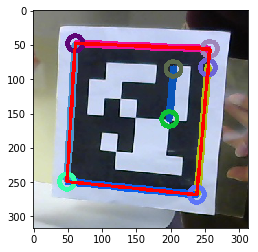

112
[array([261.61618, 180.972  ], dtype=float32), 397.58551025390625]
[array([297.34378 ,  64.149086], dtype=float32), 370.8389678955078]
[array([99.22233 , 46.013985], dtype=float32), 387.1890014648437]
[array([ 43.17537, 164.06168], dtype=float32), 413.9355438232422]


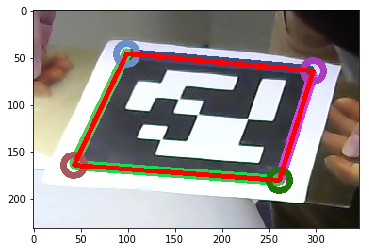

113
[array([239.15472, 260.71835], dtype=float32), 459.6459259033203]
[array([270.58508 ,  55.699924], dtype=float32), 460.3805450439453]
[array([ 76.58148, 292.27457], dtype=float32), 19.609254455566408]
[array([180.19832, 310.71185], dtype=float32), 193.30349884033203]
[array([ 40.654522, 285.88187 ], dtype=float32), 292.86984]
[array([77.906715, 47.65377 ], dtype=float32), 457.64410400390625]
[array([205.32127, 153.07817], dtype=float32), 15.129594421386718]
[array([216.84706,  78.31339], dtype=float32), 15.129594421386718]
[array([ 47.669617, 243.71465 ], dtype=float32), 456.90948486328125]


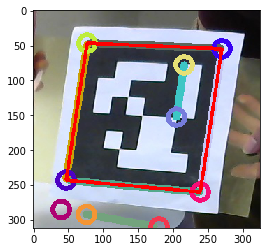

114
[array([291.88898, 269.38504], dtype=float32), 499.93483886718747]
[array([284.9756 ,  88.19887], dtype=float32), 35.78128356933594]
[array([283.16547 ,  45.248768], dtype=float32), 452.31154174804686]
[array([51.487442, 56.604015], dtype=float32), 532.9167846679687]
[array([ 50.3875, 278.0448], dtype=float32), 544.7587677001953]
[array([227.03606, 154.43018], dtype=float32), 15.519273376464843]
[array([225.20604,  76.85539], dtype=float32), 15.519273376464843]


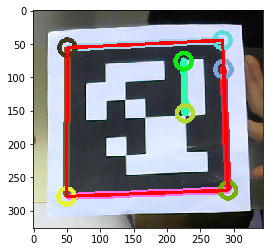

115
[array([286.2771 , 267.93823], dtype=float32), 734.2695816040039]
[array([287.43124, 140.77794], dtype=float32), 231.0175796508789]
[array([288.15244 ,  43.489834], dtype=float32), 863.0142547607422]
[array([288.66818 ,  68.155525], dtype=float32), 13.752261352539062]
[array([147.79048,  48.1273 ], dtype=float32), 268.6320175170898]
[array([60.61106, 51.41841], dtype=float32), 704.6470138549805]
[array([ 46.43889, 268.15778], dtype=float32), 536.3368286132812]


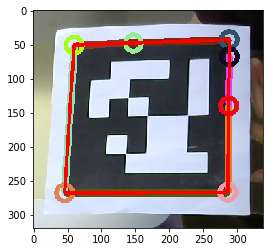

116
[array([298.3999, 271.163 ], dtype=float32), 555.3082733154297]
[array([309.4878  ,  49.078598], dtype=float32), 526.8730926513672]
[array([71.31583, 53.59284], dtype=float32), 521.4601348876953]
[array([241.4199 , 154.24927], dtype=float32), 15.282247924804688]
[array([247.03915,  78.04493], dtype=float32), 15.282247924804688]
[array([ 44.590775, 268.46274 ], dtype=float32), 549.8953155517578]


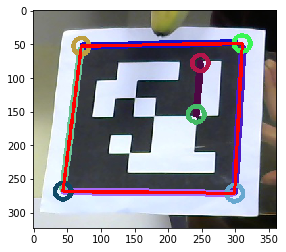

117
[array([205.52985, 250.17345], dtype=float32), 269.34404296875]
[array([222.68425, 196.73613], dtype=float32), 10.6777587890625]
[array([ 41.766563, 186.04839 ], dtype=float32), 439.76279296875003]
[array([107.790695  ,  -0.38246855], dtype=float32), 39.0808837890625]


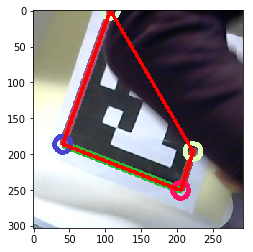

118
[array([293.23746, 255.98206], dtype=float32), 545.4071044921875]
[array([311.0958 ,  44.49743], dtype=float32), 619.0896667480469]
[array([228.11243 ,  48.077644], dtype=float32), 16.253631591796875]
[array([173.46823 ,  47.797653], dtype=float32), 150.1961]
[array([78.09317, 50.64079], dtype=float32), 614.3422348022461]
[array([240.50044, 145.7557 ], dtype=float32), 14.137252807617188]
[array([248.65488,  75.54137], dtype=float32), 14.137252807617188]
[array([252.4496  ,  42.866592], dtype=float32), 139.61423]
[array([ 41.649883, 254.427   ], dtype=float32), 544.1638153076173]
[array([148.1253  ,  49.379894], dtype=float32), 13.785591125488281]


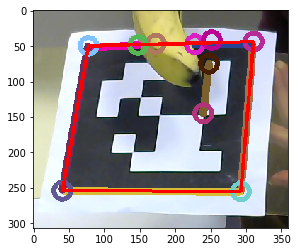

119
[array([242.1812 , 249.06839], dtype=float32), 464.69091796875]
[array([282.13785 ,  58.319237], dtype=float32), 456.63585205078124]
[array([88.2584 , 49.02629], dtype=float32), 452.4396240234375]
[array([212.28969, 146.69302], dtype=float32), 13.531710815429687]
[array([226.6915 ,  80.58502], dtype=float32), 13.531710815429687]
[array([ 43.859406, 232.25005 ], dtype=float32), 460.49468994140625]


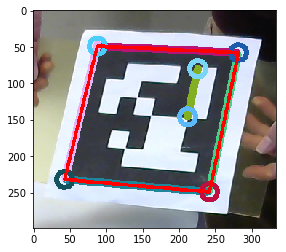

120
[array([266.39438, 161.87177], dtype=float32), 376.6689697265625]
[array([302.3872  ,  66.286255], dtype=float32), 349.6735107421875]
[array([104.79976,  45.82938], dtype=float32), 361.81739654541013]
[array([ 46.119377, 141.21733 ], dtype=float32), 388.81285552978517]


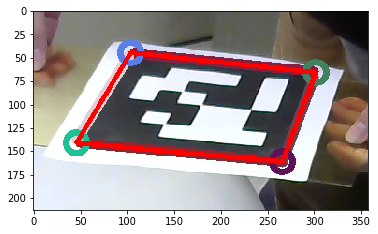

121
[array([265.48395, 166.84946], dtype=float32), 384.49174652099606]
[array([301.05762,  65.68208], dtype=float32), 356.4372055053711]
[array([103.117065,  44.98308 ], dtype=float32), 371.72457122802734]
[array([ 45.352432, 147.62437 ], dtype=float32), 399.7791122436523]


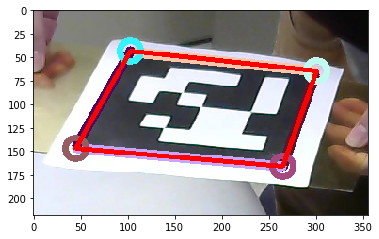

122
[array([288.73267, 270.96323], dtype=float32), 929.4398391723632]
[array([288.7603 , 141.37442], dtype=float32), 41.250213623046875]
[array([288.8011 ,  45.18583], dtype=float32), 794.0889724731445]
[array([188.63286, 270.6016 ], dtype=float32), 47.26746368408203]
[array([ 44.920723, 270.16797 ], dtype=float32), 740.7934417724609]
[array([200.62354,  47.39228], dtype=float32), 17.250547790527342]
[array([154.37766,  47.44793], dtype=float32), 191.45119934082032]
[array([57.48506 , 49.473675], dtype=float32), 668.1527191162108]


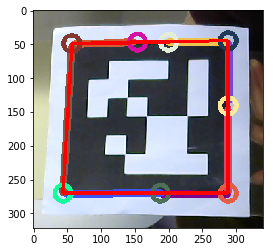

123
[array([278.7845, 263.1248], dtype=float32), 534.2195434570312]
[array([275.4612  ,  41.614357], dtype=float32), 513.4309204101562]
[array([47.70034 , 50.798172], dtype=float32), 373.6712158203125]
[array([ 41.653217, 268.32715 ], dtype=float32), 418.7255157470703]
[array([217.36284, 150.6251 ], dtype=float32), 15.500067138671875]
[array([217.35268,  73.12477], dtype=float32), 15.500067138671875]
[array([ 43.758556, 145.61201 ], dtype=float32), 24.26567687988281]


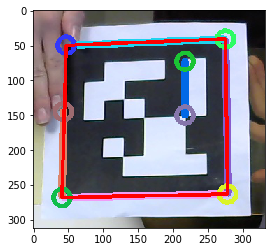

124
[array([263.60226, 232.61009], dtype=float32), 475.907958984375]
[array([285.3311 ,  49.90203], dtype=float32), 439.95220031738285]
[array([79.70707, 52.42073], dtype=float32), 438.04017333984376]
[array([221.44237, 134.49089], dtype=float32), 12.409456634521485]
[array([230.15254 ,  73.058014], dtype=float32), 12.409456634521485]
[array([ 44.094788, 230.667   ], dtype=float32), 473.9959014892578]


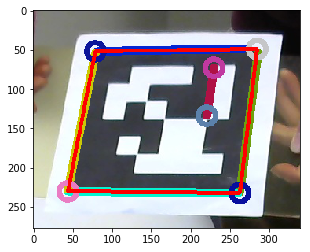

125
[array([302.10104, 266.4348 ], dtype=float32), 562.0007446289062]
[array([317.93616,  42.85088], dtype=float32), 668.6078353881836]
[array([257.69568,  42.14421], dtype=float32), 336.84574737548826]
[array([214.31516 ,  42.125515], dtype=float32), 199.3302978515625]
[array([80.175186, 42.15447 ], dtype=float32), 669.5403533935547]
[array([247.22054, 149.28557], dtype=float32), 14.826016235351563]
[array([254.51472,  75.51522], dtype=float32), 14.826016235351563]
[array([ 48.16   , 259.96863], dtype=float32), 556.6486785888673]


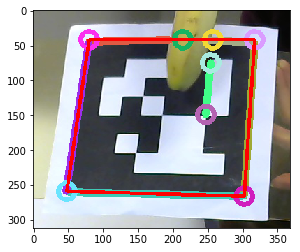

126
[array([283.5893 , 228.14465], dtype=float32), 36.263671875]
[array([278.8485  ,  45.968536], dtype=float32), 651.0421295166016]
[array([284.65527, 273.18796], dtype=float32), 610.9856948852539]
[array([222.80554, 274.57474], dtype=float32), 439.7105026245117]
[array([ 43.923393, 278.31537 ], dtype=float32), 747.4061157226563]
[array([138.43684 ,  50.115616], dtype=float32), 271.63991088867186]
[array([45.520416, 53.14368 ], dtype=float32), 724.432943725586]
[array([221.57506, 156.9026 ], dtype=float32), 15.760856628417969]
[array([220.17215,  78.11081], dtype=float32), 15.760856628417969]
[array([219.62793,  47.54538], dtype=float32), 176.29507]


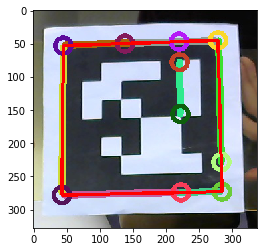

127
[array([289.95004, 258.20975], dtype=float32), 434.19177093505857]
[array([284.82138, 128.05528], dtype=float32), 25.550352478027342]
[array([281.08313,  37.08736], dtype=float32), 260.72772]
[array([ 51.724533, 268.81708 ], dtype=float32), 531.4491241455078]
[array([189.38998,  44.55896], dtype=float32), 26.595193481445314]
[array([54.614838, 55.80271 ], dtype=float32), 410.1306518554688]


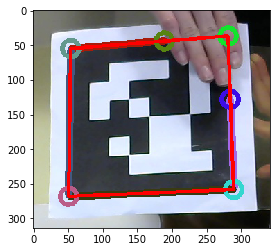

128
[array([290.48273, 163.12628], dtype=float32), 23.000448608398436]
[array([290.01733,  46.1086 ], dtype=float32), 361.59492187499995]
[array([290.14212, 271.4229 ], dtype=float32), 400.0111602783203]
[array([100.59934 ,  49.042862], dtype=float32), 37.26537170410156]
[array([58.610634, 50.289616], dtype=float32), 444.83624267578125]
[array([ 47.245876, 271.8405  ], dtype=float32), 543.5183319091797]
[array([229.02025, 154.34338], dtype=float32), 15.251963806152343]
[array([230.52206,  78.09835], dtype=float32), 15.251963806152343]


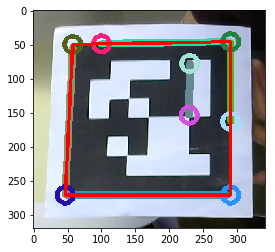

129
[array([286.03772, 267.96402], dtype=float32), 528.3177612304687]
[array([281.2001  ,  52.116127], dtype=float32), 366.2600799560547]
[array([184.33876,  54.28812], dtype=float32), 19.020120239257814]
[array([54.07961, 58.45779], dtype=float32), 345.75343933105466]
[array([ 48.67847, 274.06003], dtype=float32), 526.8312713623047]


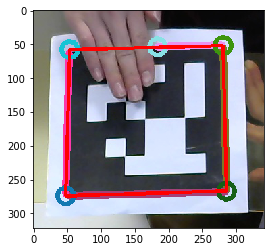

130
[array([287.81958, 249.88657], dtype=float32), 704.8867767333984]
[array([311.8457 ,  39.20252], dtype=float32), 343.2429504394531]
[array([216.90936, 247.98453], dtype=float32), 49.01185302734375]
[array([ 39.61832, 244.0217 ], dtype=float32), 718.5465240478516]
[array([181.88225,  42.09838], dtype=float32), 20.01380157470703]
[array([80.16743, 45.70293], dtype=float32), 359.25589752197266]


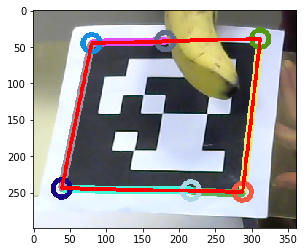

131
[array([286.49362, 267.40216], dtype=float32), 544.6886718750001]
[array([282.68454 ,  43.612682], dtype=float32), 535.8223358154297]
[array([51.993114, 52.318714], dtype=float32), 528.393896484375]
[array([ 47.12381, 272.21396], dtype=float32), 537.2602325439453]
[array([224.39113, 153.1252 ], dtype=float32), 15.500080871582032]
[array([224.37833 ,  75.624794], dtype=float32), 15.500080871582032]


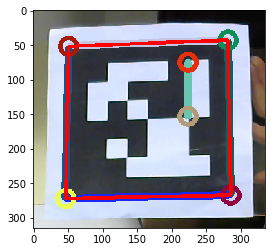

132
[array([240.08269, 254.01057], dtype=float32), 464.4416046142578]
[array([278.89844,  57.97751], dtype=float32), 635.6582717895508]
[array([173.17126 ,  53.829704], dtype=float32), 37.27866973876953]
[array([85.00881, 50.62155], dtype=float32), 616.8853912353516]
[array([209.76279, 149.453  ], dtype=float32), 13.826507568359375]
[array([223.39647 ,  81.678154], dtype=float32), 13.826507568359375]
[array([228.69012,  55.36262], dtype=float32), 153.00616]
[array([ 44.435658, 237.83546 ], dtype=float32), 456.235986328125]


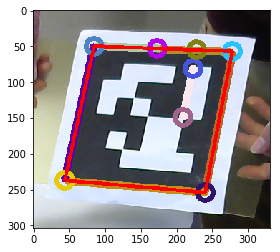

133
[array([314.23853 ,  65.404366], dtype=float32), 332.5394546508789]
[array([117.514854,  42.973824], dtype=float32), 346.18395843505857]
[array([274.0068 , 140.82722], dtype=float32), 361.55130767822266]
[array([ 53.49165, 114.3033 ], dtype=float32), 375.19581146240233]


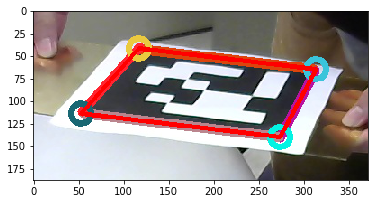

134
[array([304.62338 ,  65.086784], dtype=float32), 366.4742416381836]
[array([108.230675,  44.04067 ], dtype=float32), 375.2953155517578]
[array([256.27533, 169.02783], dtype=float32), 392.3207504272461]
[array([ 39.71708, 144.37479], dtype=float32), 401.1418243408203]


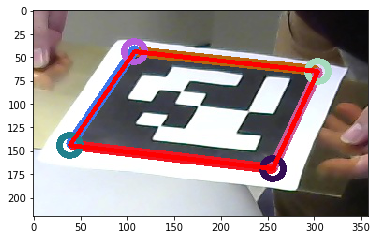

135
[array([313.7425 ,  67.78854], dtype=float32), 341.99022064208987]
[array([117.73638 ,  43.071857], dtype=float32), 355.6348358154297]
[array([266.017 , 153.8642], dtype=float32), 371.59376373291013]
[array([ 48.704895, 125.008255], dtype=float32), 385.23837890625]


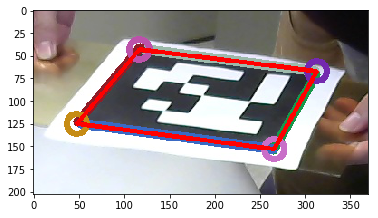

136
[array([309.1349  ,  66.960526], dtype=float32), 358.01074371337893]
[array([112.52965,  43.97665], dtype=float32), 370.87320709228516]
[array([260.45056, 163.51372], dtype=float32), 382.5546401977539]
[array([ 43.72048, 137.33885], dtype=float32), 395.4171035766601]


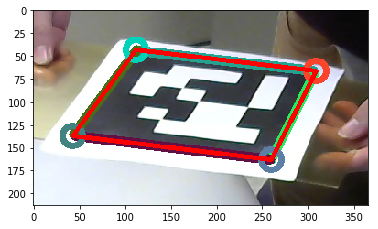

137
[array([296.0424 , 266.57773], dtype=float32), 546.4349151611328]
[array([310.61478 ,  43.308804], dtype=float32), 640.0959426879883]
[array([250.56917 ,  42.521225], dtype=float32), 335.46890411376955]
[array([211.86292,  42.7197 ], dtype=float32), 167.6972]
[array([74.27667 , 43.919838], dtype=float32), 655.7922790527343]
[array([240.89598, 149.16893], dtype=float32), 15.526239013671875]
[array([248.04254,  71.86738], dtype=float32), 15.526239013671875]
[array([ 44.26782, 262.12256], dtype=float32), 550.3488311767578]
[array([181.89522,  43.72675], dtype=float32), 21.030133056640626]


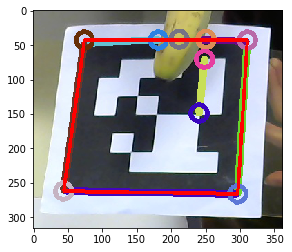

138
[array([192.32416, 185.79897], dtype=float32), 15.041435241699219]
[array([219.48695, 115.66836], dtype=float32), 15.041435241699219]
[array([228.4438 ,  93.01683], dtype=float32), 234.25204467773438]
[array([103.418526,  47.769943], dtype=float32), 379.728369140625]
[array([ 36.90936, 227.9734 ], dtype=float32), 424.33022460937497]
[array([192.8086, 296.3501], dtype=float32), 33.94111938476563]


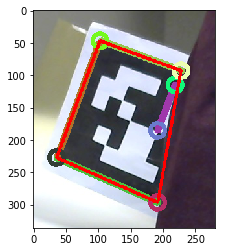

139
[array([286.39883, 252.52791], dtype=float32), 523.9401382446289]
[array([301.3312 , 136.80493], dtype=float32), 23.4427490234375]
[array([313.07718 ,  45.646523], dtype=float32), 262.21698]
[array([158.24855, 249.33505], dtype=float32), 291.07097320556636]
[array([ 41.89907, 246.59106], dtype=float32), 699.758432006836]
[array([231.8562 ,  46.79167], dtype=float32), 29.000643920898437]
[array([85.45329 , 49.355724], dtype=float32), 409.7483276367187]
xxx


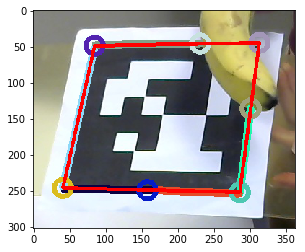

140
[array([259.01352, 182.24612], dtype=float32), 412.21666259765624]
[array([307.33527 ,  61.937992], dtype=float32), 386.2526336669922]
[array([109.979614,  44.86776 ], dtype=float32), 389.9088500976563]
[array([ 43.792923, 160.55913 ], dtype=float32), 415.8728790283203]


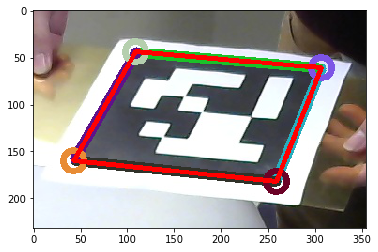

141
[array([279.6111 , 270.99344], dtype=float32), 517.7745086669922]
[array([287.01736 ,  47.943977], dtype=float32), 522.3510528564453]
[array([62.81183, 52.21357], dtype=float32), 518.6948699951172]
[array([ 46.69092, 269.93372], dtype=float32), 514.1182647705078]
[array([225.19426, 153.15857], dtype=float32), 15.267919921875]
[array([228.3191 ,  76.88295], dtype=float32), 15.267919921875]


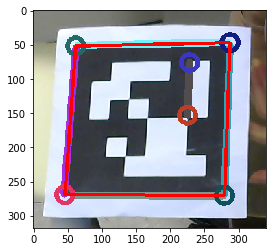

142
[array([277.8232 , 261.55127], dtype=float32), 537.0558135986328]
[array([276.65594 ,  41.229965], dtype=float32), 460.58877258300777]
[array([105.620186,  44.10696 ], dtype=float32), 33.51256408691406]
[array([45.901554, 45.18023 ], dtype=float32), 251.3501]
[array([ 39.516678, 263.7766  ], dtype=float32), 378.08715667724607]
[array([218.31464, 146.87506], dtype=float32), 15.000030517578125]
[array([218.30984,  71.87491], dtype=float32), 15.000030517578125]
[array([ 41.81854, 178.16165], dtype=float32), 16.75745391845703]


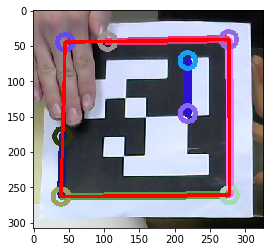

143
[array([280.96637, 268.18805], dtype=float32), 531.2706329345704]
[array([276.68414 ,  51.989307], dtype=float32), 379.75114593505856]
[array([170.59604 ,  54.550007], dtype=float32), 20.769407653808592]
[array([49.01793 , 54.118233], dtype=float32), 655.4514251708985]
[array([ 43.68242, 273.90567], dtype=float32), 726.8698837280274]
[array([219.38837, 146.87537], dtype=float32), 13.250148010253906]
[array([219.36885,  80.62463], dtype=float32), 13.250148010253906]
[array([ 45.141113, 213.15273 ], dtype=float32), 41.773625183105466]


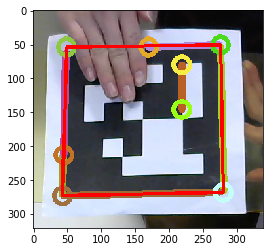

144
[array([292.28436, 262.42062], dtype=float32), 730.6011505126953]
[array([283.64578 ,  39.024044], dtype=float32), 323.2416198730469]
[array([125.58339, 268.62964], dtype=float32), 46.04283599853516]
[array([ 53.968994, 270.69604 ], dtype=float32), 673.0547073364258]
[array([126.91525 ,  52.299988], dtype=float32), 13.581291198730469]
[array([56.709152, 59.463646], dtype=float32), 315.5260269165039]


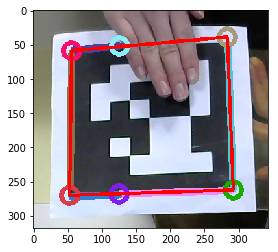

145
[array([291.669  , 265.54694], dtype=float32), 534.6620391845703]
[array([282.21533 ,  43.268356], dtype=float32), 337.93232421875]
[array([ 53.342667, 275.05267 ], dtype=float32), 529.866943359375]
[array([141.8784  ,  54.413563], dtype=float32), 16.8170166015625]
[array([55.6683  , 62.445637], dtype=float32), 349.95424499511716]


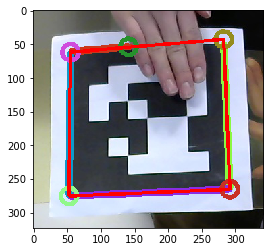

146
[array([291.54053, 254.56586], dtype=float32), 527.4008056640625]
[array([310.0495 ,  43.60238], dtype=float32), 611.3758422851563]
[array([249.62524,  42.47081], dtype=float32), 156.9723907470703]
[array([193.2246 ,  45.51588], dtype=float32), 146.46912]
[array([77.37305, 48.54507], dtype=float32), 605.6878509521484]
[array([239.59683, 145.65079], dtype=float32), 14.108427429199219]
[array([247.74315 ,  75.580605], dtype=float32), 14.108427429199219]
[array([ 41.234238, 254.02629 ], dtype=float32), 524.6940643310547]
[array([149.44598,  48.08467], dtype=float32), 14.284109497070313]


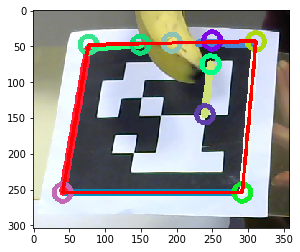

147
[array([322.2438,  73.2922], dtype=float32), 285.56531982421876]
[array([130.72545,  41.65413], dtype=float32), 305.9406005859375]
[array([281.87012, 120.49866], dtype=float32), 338.3099090576172]
[array([61.359882, 87.58362 ], dtype=float32), 358.6851593017578]


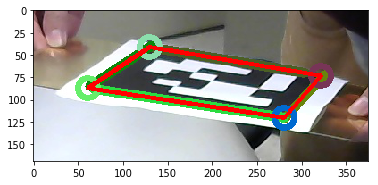

148
[array([294.6005 , 252.77373], dtype=float32), 444.51893920898436]
[array([312.01352 ,  38.552032], dtype=float32), 350.88576049804686]
[array([ 43.663277, 251.85374 ], dtype=float32), 479.39172668457036]
[array([243.12993, 252.61273], dtype=float32), 39.250543212890626]
[array([181.86676,  42.9288 ], dtype=float32), 20.523905944824218]
[array([77.68604 , 47.516853], dtype=float32), 367.0319107055664]


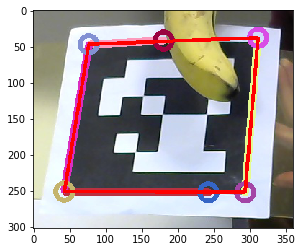

149
[array([301.6474, 121.6952], dtype=float32), 20.10101318359375]
[array([282.75336 ,  16.505148], dtype=float32), 335.3468994140625]
[array([ 92.29963, 274.44882], dtype=float32), 547.1273803710938]
[array([302.00284, 257.1605 ], dtype=float32), 41.93792724609375]
[array([100.56699 ,  22.795122], dtype=float32), 35.79013671875]
[array([56.121292, 24.907652], dtype=float32), 474.45050048828125]
[array([245.66966, 133.31123], dtype=float32), 16.76459503173828]
[array([232.87044,  50.4712 ], dtype=float32), 16.76459503173828]


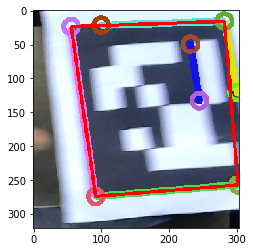

150
[array([285.8655 , 267.74875], dtype=float32), 532.9937225341797]
[array([279.8829  ,  51.178375], dtype=float32), 366.34595947265626]
[array([185.58704 ,  54.668976], dtype=float32), 18.525112915039063]
[array([53.005623, 60.170357], dtype=float32), 346.22633056640626]
[array([ 48.839653, 275.75732 ], dtype=float32), 531.3992065429687]
[array([223.32767, 158.12534], dtype=float32), 15.250157165527344]
[array([223.30354,  81.87455], dtype=float32), 15.250157165527344]


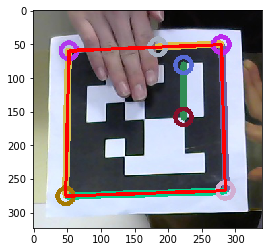

151
[array([294.62598, 255.24702], dtype=float32), 716.1394790649414]
[array([311.979   ,  38.143913], dtype=float32), 357.6134399414062]
[array([228.1401 , 254.23305], dtype=float32), 49.00929718017578]
[array([ 43.550255, 252.1182  ], dtype=float32), 730.6681182861328]
[array([186.87405,  41.8504 ], dtype=float32), 21.522581481933592]
[array([77.05265 , 46.442844], dtype=float32), 374.24696197509763]


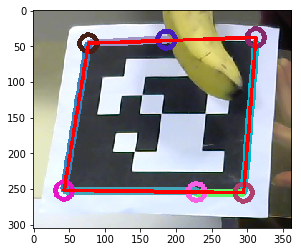

152
[array([320.09082,  70.89723], dtype=float32), 313.7994155883789]
[array([124.073784,  44.12784 ], dtype=float32), 328.3042221069336]
[array([282.09122, 129.79976], dtype=float32), 344.77188873291016]
[array([60.290836, 97.731995], dtype=float32), 359.27669525146484]


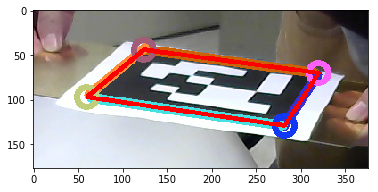

153
[array([145.45934, 267.2643 ], dtype=float32), 207.51670455932617]
[array([167.30132, 322.20425], dtype=float32), 11.559542083740235]
[array([49.63697 , 27.853113], dtype=float32), 119.094864]
[array([ 36.365967, 223.41338 ], dtype=float32), 356.4005126953125]
[array([163.50111 ,  63.162106], dtype=float32), 12.259431457519531]
[array([98.87432 , 43.977604], dtype=float32), 291.79764556884766]


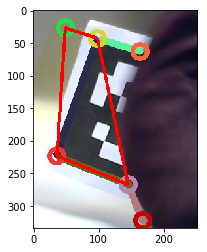

154
[array([238.16699, 271.0533 ], dtype=float32), 470.6291748046875]
[array([259.33875,  59.15692], dtype=float32), 445.1498260498047]
[array([88.229454, 48.744038], dtype=float32), 34.016998291015625]
[array([60.312866, 47.403427], dtype=float32), 409.50202026367185]
[array([198.24767, 160.63672], dtype=float32), 15.323532104492188]
[array([205.53041,  84.36597], dtype=float32), 15.323532104492188]
[array([ 44.109615, 250.15468 ], dtype=float32), 468.9983673095703]


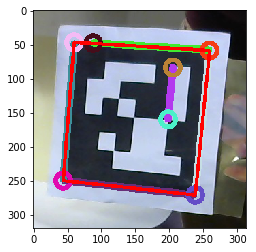

155
[array([292.3715 , 264.98264], dtype=float32), 533.2467742919922]
[array([282.00018 ,  42.787933], dtype=float32), 342.91981506347656]
[array([ 54.282196, 275.62732 ], dtype=float32), 531.4034210205078]
[array([145.58998 ,  53.992622], dtype=float32), 17.812828063964844]
[array([55.258133, 62.51168 ], dtype=float32), 358.88932037353516]


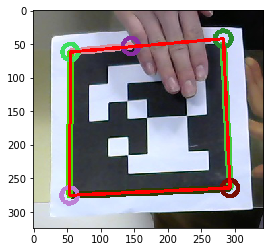

156
[array([241.91872, 241.23892], dtype=float32), 459.25165710449215]
[array([283.84457 ,  56.499138], dtype=float32), 396.8509643554687]
[array([138.20561 ,  49.021927], dtype=float32), 28.776495361328124]
[array([88.92877 , 46.918865], dtype=float32), 357.5227966308594]
[array([212.8949 , 140.57033], dtype=float32), 13.09815673828125]
[array([228.03477,  76.85356], dtype=float32), 13.09815673828125]
[array([ 41.641422, 224.48875 ], dtype=float32), 448.6999542236328]


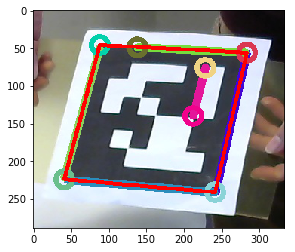

157
[array([297.09662, 270.0765 ], dtype=float32), 727.9096160888672]
[array([313.65384 ,  48.772884], dtype=float32), 658.1189453125]
[array([228.47247, 268.216  ], dtype=float32), 288.7864624023438]
[array([ 45.522243, 264.86197 ], dtype=float32), 736.9204132080079]
[array([252.0268 ,  47.57953], dtype=float32), 197.51758728027343]
[array([184.3998  ,  49.672142], dtype=float32), 201.53694763183594]
[array([76.5433 , 51.59101], dtype=float32), 658.1339111328125]
[array([242.78369, 154.46194], dtype=float32), 15.098486328125]
[array([249.97377,  79.31269], dtype=float32), 15.098486328125]


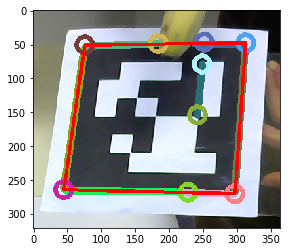

158
[array([294.08087, 269.77023], dtype=float32), 479.4227233886719]
[array([311.1563  ,  44.805138], dtype=float32), 371.82866821289065]
[array([240.12286, 153.07318], dtype=float32), 14.826058959960937]
[array([247.73222 ,  79.334465], dtype=float32), 14.826058959960937]
[array([251.20496 ,  45.681854], dtype=float32), 184.1182]
[array([ 43.001022, 264.61063 ], dtype=float32), 516.0933471679688]
[array([263.15414, 269.18588], dtype=float32), 43.516387939453125]
[array([185.57329,  47.6547 ], dtype=float32), 21.997579956054686]
[array([74.48634, 51.22302], dtype=float32), 386.9805145263672]


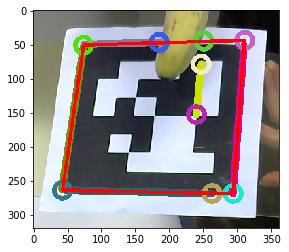

159
[array([293.43988, 265.9415 ], dtype=float32), 715.4576858520508]
[array([308.9162 ,  41.43106], dtype=float32), 335.63427734375]
[array([224.34898, 264.3628 ], dtype=float32), 287.04027252197267]
[array([ 41.335556, 261.9826  ], dtype=float32), 748.613848876953]
[array([238.52458, 150.54414], dtype=float32), 15.050971984863281]
[array([245.64806,  75.62719], dtype=float32), 15.050971984863281]
[array([248.91824 ,  41.234695], dtype=float32), 164.1309]
[array([163.1775  ,  44.502525], dtype=float32), 17.775209045410158]
[array([71.59057, 48.16501], dtype=float32), 362.90522613525394]


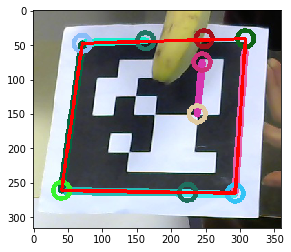

160
[array([285.31088, 258.2263 ], dtype=float32), 403.2256713867188]
[array([293.38495,  74.44134], dtype=float32), 36.780419921875]
[array([294.21622 ,  49.731144], dtype=float32), 449.5836700439453]
[array([67.585785, 55.814926], dtype=float32), 506.42329101562495]
[array([230.19731, 146.8471 ], dtype=float32), 13.286988830566406]
[array([234.52057,  80.55298], dtype=float32), 13.286988830566406]
[array([223.56035, 258.8948 ], dtype=float32), 285.48671875]
[array([ 42.54808, 260.6208 ], dtype=float32), 459.7935028076172]


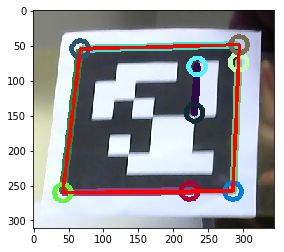

161
[array([279.22772, 270.6688 ], dtype=float32), 735.5530883789062]
[array([288.49506 ,  46.359295], dtype=float32), 698.0654403686523]
[array([178.14261, 268.958  ], dtype=float32), 46.26029968261719]
[array([ 44.106018, 266.57156 ], dtype=float32), 730.3463958740234]
[array([218.98781 ,  45.872803], dtype=float32), 450.19662017822264]
[array([63.66606 , 46.018574], dtype=float32), 699.1106964111327]
[array([225.17783, 154.35089], dtype=float32), 15.517898559570312]
[array([229.35385,  76.87386], dtype=float32), 15.517898559570312]
[array([218.98947, 269.16263], dtype=float32), 210.10953]


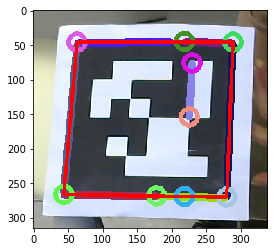

162
[array([170.5094, 167.8408], dtype=float32), 14.091915893554688]
[array([240.7698 , 162.54668], dtype=float32), 14.091915893554688]
[array([218.12553 ,  33.323044], dtype=float32), 9.250251007080077]
[array([171.87428,  33.29964], dtype=float32), 9.250251007080077]
[array([104.88022 ,  33.317432], dtype=float32), 110.75956344604492]
[array([49.98698 , 33.237972], dtype=float32), 105.98979]
[array([135.7168 ,  78.06174], dtype=float32), 10.751384735107422]
[array([38.613052, 48.818783], dtype=float32), 11.947708129882812]
[array([ 3.3906653, 97.06893  ], dtype=float32), 11.947708129882812]


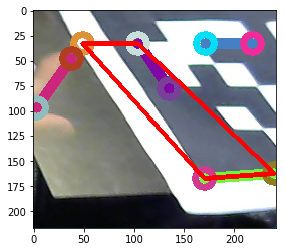

163
[array([291.13013, 251.90689], dtype=float32), 670.2247436523437]
[array([307.63208 ,  39.792778], dtype=float32), 309.34116821289064]
[array([198.48021, 251.34149], dtype=float32), 44.0251220703125]
[array([263.14642, 253.375  ], dtype=float32), 12.76849365234375]
[array([ 39.681477, 250.70691 ], dtype=float32), 695.3345611572265]
[array([179.38797,  42.31711], dtype=float32), 12.766512298583985]
[array([115.58288 ,  44.189537], dtype=float32), 12.766512298583985]
[array([73.33037 , 46.100456], dtype=float32), 305.98839416503904]


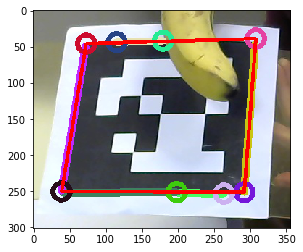

164
[array([263.23102, 213.54219], dtype=float32), 582.1203460693359]
[array([294.758  ,  55.85778], dtype=float32), 423.9339111328125]
[array([94.9446  , 49.684204], dtype=float32), 414.8976928710938]
[array([142.27449, 208.45198], dtype=float32), 250.83394927978517]
[array([ 48.498257, 204.43187 ], dtype=float32), 562.2903060913086]


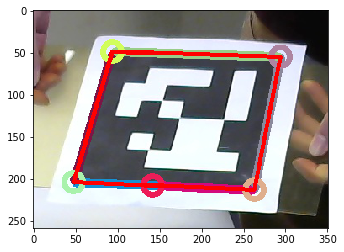

165
[array([299.18152, 295.38513], dtype=float32), 570.6395538330078]
[array([292.17645 ,  50.035732], dtype=float32), 557.0182586669922]
[array([ 51.039738, 306.54373 ], dtype=float32), 788.3252685546875]
[array([50.095665, 59.88521 ], dtype=float32), 986.3488830566406]
[array([232.22615, 171.91252], dtype=float32), 13.265438842773438]
[array([231.0683  , 105.595436], dtype=float32), 13.265438842773438]
[array([ 49.87687, 144.38562], dtype=float32), 47.74891357421875]


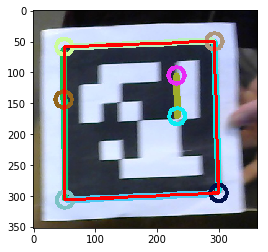

166
[array([283.93942, 256.24368], dtype=float32), 424.32030181884767]
[array([298.8441 , 143.05629], dtype=float32), 22.698948669433594]
[array([310.98166 ,  49.278133], dtype=float32), 256.0594]
[array([ 39.5791 , 250.85999], dtype=float32), 525.013330078125]
[array([226.89789 ,  50.714775], dtype=float32), 28.51292724609375]
[array([83.08683 , 53.421234], dtype=float32), 407.9642608642578]


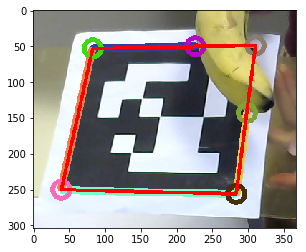

167
[array([288.21243, 250.96925], dtype=float32), 535.3622344970703]
[array([309.1853  ,  45.123554], dtype=float32), 484.4388397216797]
[array([105.58612,  48.52973], dtype=float32), 40.26626281738281]
[array([78.86533 , 49.609337], dtype=float32), 436.96181030273436]
[array([237.78821, 143.0834 ], dtype=float32), 14.35705108642578]
[array([246.58852 ,  71.839615], dtype=float32), 14.35705108642578]
[array([ 40.03767, 249.48128], dtype=float32), 528.1514678955078]


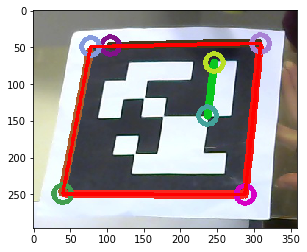

168
[array([268.31467, 239.57755], dtype=float32), 490.13939208984374]
[array([285.74713,  49.01787], dtype=float32), 473.7717803955078]
[array([73.20333 , 54.554024], dtype=float32), 471.0886993408203]
[array([221.59793, 139.21098], dtype=float32), 12.810575866699219]
[array([228.438  ,  75.52437], dtype=float32), 12.810575866699219]
[array([ 43.131474, 240.6396  ], dtype=float32), 487.45631103515626]


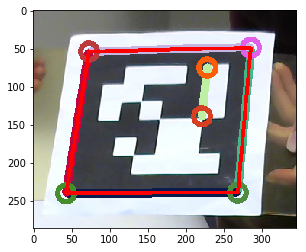

169
[array([276.89175, 267.75327], dtype=float32), 537.118505859375]
[array([284.67413 ,  43.367954], dtype=float32), 412.9586120605469]
[array([ 45.181755, 265.75766 ], dtype=float32), 528.9949951171875]
[array([222.60085, 151.84875], dtype=float32), 15.767800903320312]
[array([226.54462,  73.10845], dtype=float32), 15.767800903320312]
[array([226.27368,  44.3257 ], dtype=float32), 257.46587829589845]
[array([62.277794, 48.52954 ], dtype=float32), 434.6062469482422]


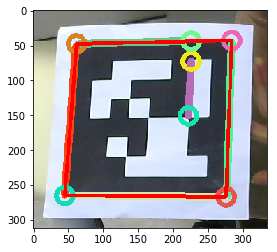

170
[array([301.55746, 269.64282], dtype=float32), 754.5224533081055]
[array([309.1676  ,  47.669266], dtype=float32), 541.8714477539063]
[array([178.14091, 269.68063], dtype=float32), 50.75841522216797]
[array([ 44.782875, 269.67325 ], dtype=float32), 750.7592651367188]
[array([68.917496, 51.606487], dtype=float32), 538.8610107421875]
[array([241.72102, 153.18793], dtype=float32), 15.061317443847656]
[array([246.03766,  78.00516], dtype=float32), 15.061317443847656]
[array([235.1026 , 268.46115], dtype=float32), 206.5925]


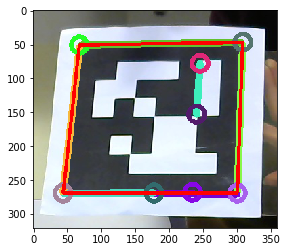

171
[array([296.69226, 268.21848], dtype=float32), 456.6926025390625]
[array([302.1114  ,  50.345596], dtype=float32), 477.2163543701172]
[array([115.60305 ,  53.054817], dtype=float32), 36.76154479980469]
[array([68.07693 , 54.372746], dtype=float32), 435.5830383300781]
[array([237.92  , 153.1696], dtype=float32), 15.028999328613281]
[array([241.12408,  78.09295], dtype=float32), 15.028999328613281]
[array([235.37674, 268.9631 ], dtype=float32), 315.1996612548828]
[array([ 48.985264, 270.94983 ], dtype=float32), 491.8300018310547]


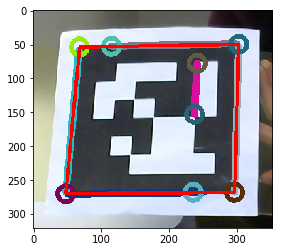

172
[array([296.485  , 270.98004], dtype=float32), 715.4263847351075]
[array([313.66925 ,  48.710247], dtype=float32), 635.7214698791504]
[array([231.20782, 269.4707 ], dtype=float32), 450.3381401062012]
[array([ 44.887207, 265.22446 ], dtype=float32), 744.1754608154297]
[array([253.08595,  48.22094], dtype=float32), 333.3759315490723]
[array([186.09006 ,  48.953995], dtype=float32), 188.64166870117188]
[array([76.83371 , 50.670006], dtype=float32), 647.9742645263672]
[array([242.47641, 155.55946], dtype=float32), 15.323538208007813]
[array([250.17816,  79.32986], dtype=float32), 15.323538208007813]


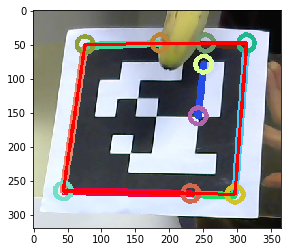

173
[array([276.1024 , 260.96973], dtype=float32), 496.8010620117187]
[array([285.3122 ,  53.22302], dtype=float32), 482.33876647949216]
[array([64.79364, 66.79186], dtype=float32), 494.2565185546875]
[array([ 44.54029, 267.69852], dtype=float32), 508.7188446044922]
[array([222.62659, 154.41988], dtype=float32), 14.798280334472656]
[array([227.03673,  80.56002], dtype=float32), 14.798280334472656]


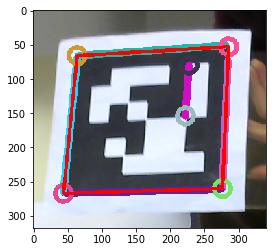

174
[array([307.72818, 276.2066 ], dtype=float32), 749.3358169555663]
[array([316.6073 ,  52.40259], dtype=float32), 435.2842224121094]
[array([238.39484, 275.26978], dtype=float32), 299.2478286743164]
[array([ 50.76591, 274.2386 ], dtype=float32), 761.4988098144531]
[array([248.3202, 158.2105], dtype=float32), 15.796331787109375]
[array([252.98474,  79.3667 ], dtype=float32), 15.796331787109375]
[array([283.13394 ,  52.156815], dtype=float32), 34.50303344726562]
[array([110.61966,  52.71039], dtype=float32), 34.50303344726562]
[array([74.53978, 53.22907], dtype=float32), 432.2450347900391]


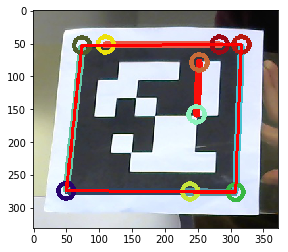

175
[array([265.5744 , 206.12349], dtype=float32), 432.3497680664062]
[array([298.51764,  57.96319], dtype=float32), 411.28765869140625]
[array([99.18422, 47.1353 ], dtype=float32), 413.2190887451172]
[array([ 49.978897, 193.15692 ], dtype=float32), 434.28119812011715]


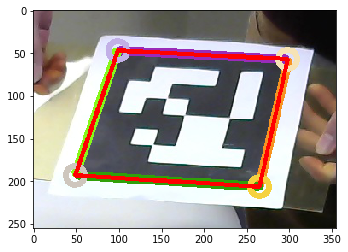

176
[array([299.97278, 264.32346], dtype=float32), 555.8559051513672]
[array([315.39725 ,  41.665367], dtype=float32), 374.82448425292966]
[array([ 45.606945, 258.93915 ], dtype=float32), 549.3947052001953]
[array([196.89412,  43.84117], dtype=float32), 23.51831512451172]
[array([77.236664, 47.392582], dtype=float32), 391.88162994384766]


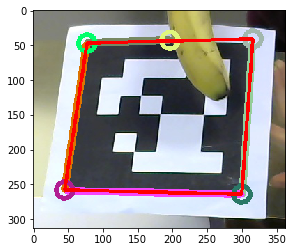

177
[array([269.03644, 254.50803], dtype=float32), 692.8411926269531]
[array([278.2747  ,  49.520542], dtype=float32), 497.30053405761714]
[array([120.59338, 258.70654], dtype=float32), 44.03216705322266]
[array([ 42.560394, 260.92523 ], dtype=float32), 666.4293563842774]
[array([61.74654 , 61.158005], dtype=float32), 490.8009887695312]
[array([211.13179, 255.53615], dtype=float32), 146.43636]
[array([217.06548, 150.56511], dtype=float32), 14.519218444824219]
[array([221.16255 ,  78.084724], dtype=float32), 14.519218444824219]


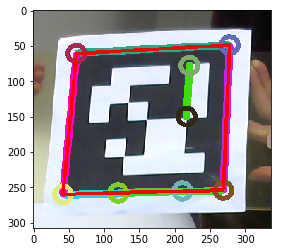

178
[array([282.36865, 250.82367], dtype=float32), 342.9187957763672]
[array([295.3782 , 135.31563], dtype=float32), 23.191256713867187]
[array([305.83636,  42.46052], dtype=float32), 241.01215]
[array([ 35.973595, 249.06161 ], dtype=float32), 482.52788085937505]
[array([243.14288, 250.5695 ], dtype=float32), 40.754251098632814]
[array([203.1159  ,  45.295773], dtype=float32), 25.01117401123047]
[array([76.51895, 49.32812], dtype=float32), 388.06941070556644]


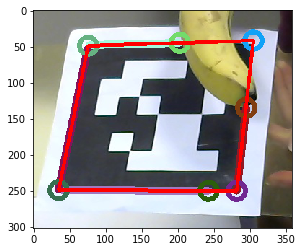

179
[array([280.01697, 261.18726], dtype=float32), 682.7042221069336]
[array([294.248  ,  68.20772], dtype=float32), 38.57963256835937]
[array([296.05704,  43.02223], dtype=float32), 458.4092590332031]
[array([163.16408, 258.4668 ], dtype=float32), 47.01326293945313]
[array([ 43.030582, 255.60143 ], dtype=float32), 722.0295486450195]
[array([70.36723 , 42.168846], dtype=float32), 518.1721435546875]
[array([228.40016, 146.90045], dtype=float32), 15.346356201171876]
[array([235.46631,  70.49472], dtype=float32), 15.346356201171876]
[array([218.0574, 258.7354], dtype=float32), 195.48834]


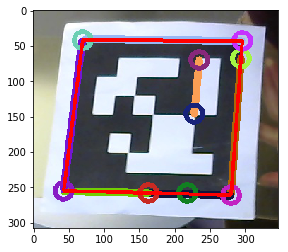

180
[array([291.4969 , 250.11641], dtype=float32), 528.5641082763672]
[array([303.53156 ,  45.922173], dtype=float32), 471.65500488281253]
[array([105.59279 ,  48.699127], dtype=float32), 39.01545104980469]
[array([74.44386 , 49.790684], dtype=float32), 428.8525665283203]
[array([236.42633, 142.97774], dtype=float32), 14.510594177246094]
[array([242.69243,  70.69586], dtype=float32), 14.510594177246094]
[array([ 45.61318, 250.35475], dtype=float32), 524.7771209716797]


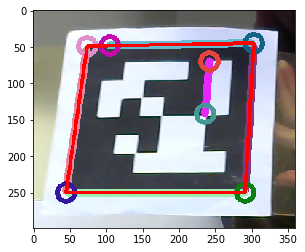

181
[array([285.7386 , 265.10547], dtype=float32), 538.5418579101563]
[array([287.97   ,  44.33757], dtype=float32), 469.6503631591797]
[array([105.59636 ,  48.121014], dtype=float32), 35.269354248046874]
[array([60.752197, 49.6491  ], dtype=float32), 429.0760040283203]
[array([227.10124, 150.63252], dtype=float32), 15.258192443847657]
[array([229.63628,  74.38369], dtype=float32), 15.258192443847657]
[array([ 47.229065, 265.86145 ], dtype=float32), 533.2368530273437]


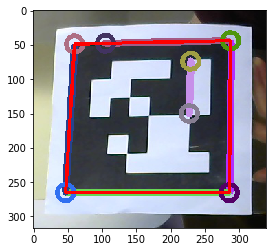

182
[array([296.7124, 267.0761], dtype=float32), 767.5156997680664]
[array([296.91174, 163.7168 ], dtype=float32), 42.75011138916015]
[array([296.766   ,  46.480347], dtype=float32), 737.0581787109375]
[array([63.649895, 51.942677], dtype=float32), 526.0219482421875]
[array([235.18343, 151.86316], dtype=float32), 15.25792236328125]
[array([237.22777 ,  75.600945], dtype=float32), 15.25792236328125]
[array([ 48.39682, 267.75058], dtype=float32), 543.862353515625]


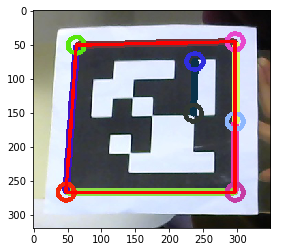

183
[array([276.41782, 259.75406], dtype=float32), 531.0912597656251]
[array([273.5669 ,  40.74091], dtype=float32), 438.1333709716797]
[array([114.34884 ,  42.883915], dtype=float32), 31.012771606445312]
[array([44.71061 , 44.105568], dtype=float32), 227.64944]
[array([ 37.73148, 261.54663], dtype=float32), 366.13725433349606]
[array([216.22078, 146.8734 ], dtype=float32), 15.499952697753907]
[array([216.41132,  69.37386], dtype=float32), 15.499952697753907]
[array([ 39.8528 , 186.89125], dtype=float32), 14.517118835449219]


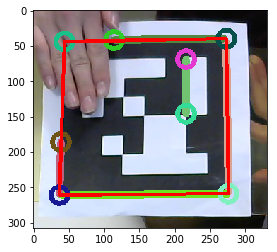

184
[array([278.30243, 266.27887], dtype=float32), 450.1598907470703]
[array([275.16754, 123.16612], dtype=float32), 28.253848266601562]
[array([273.14337 ,  48.668953], dtype=float32), 285.43760833740237]
[array([ 40.594223, 272.16507 ], dtype=float32), 505.744921875]
[array([150.56964,  52.6854 ], dtype=float32), 24.028062438964845]
[array([45.026016, 56.1438  ], dtype=float32), 307.7304]
[array([216.43095, 155.62556], dtype=float32), 13.500625610351562]
[array([216.34499,  88.12249], dtype=float32), 13.500625610351562]
[array([44.457344, 83.100365], dtype=float32), 37.518017578125]


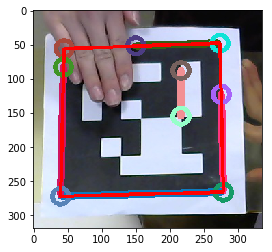

185
[array([287.41208, 254.59557], dtype=float32), 607.0376075744629]
[array([302.13873, 141.90945], dtype=float32), 22.914547729492188]
[array([314.3136  ,  48.722984], dtype=float32), 260.86572]
[array([223.76749, 253.07307], dtype=float32), 446.35618820190433]
[array([164.70148, 251.47124], dtype=float32), 128.79974]
[array([ 42.82268, 248.80095], dtype=float32), 880.1577377319336]
[array([240.8624 , 146.91313], dtype=float32), 12.412149810791016]
[array([250.70644 ,  85.638084], dtype=float32), 12.412149810791016]
[array([254.12317 ,  49.329967], dtype=float32), 237.6123260498047]
[array([117.90584, 251.09123], dtype=float32), 32.76934661865234]
[array([87.36749 , 51.236427], dtype=float32), 415.36867980957027]
xxx


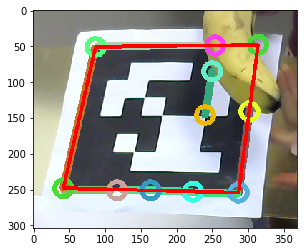

186
[array([288.63263, 270.37372], dtype=float32), 757.0374237060546]
[array([288.90656, 169.37537], dtype=float32), 43.50000915527344]
[array([288.81204,  46.58104], dtype=float32), 640.118505859375]
[array([105.60281 ,  49.112385], dtype=float32), 36.2607666015625]
[array([58.71077, 50.24059], dtype=float32), 436.92529296875]
[array([228.44073, 153.15317], dtype=float32), 15.7564453125]
[array([229.85805,  74.38369], dtype=float32), 15.7564453125]
[array([ 45.835285, 268.93436 ], dtype=float32), 539.1418579101562]


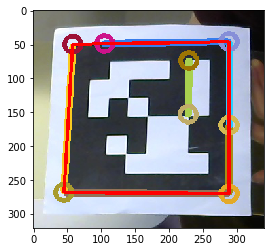

187
[array([287.57068, 284.89438], dtype=float32), 555.3936004638672]
[array([281.6186 ,  49.21613], dtype=float32), 554.2163787841797]
[array([ 47.90669, 293.83035], dtype=float32), 549.2696746826172]
[array([45.662666, 62.859863], dtype=float32), 548.0924530029297]
[array([223.48851, 166.89017], dtype=float32), 16.510417175292968]
[array([222.07596,  84.35017], dtype=float32), 16.510417175292968]


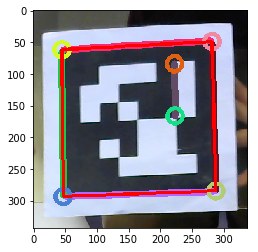

188
[array([281.14285, 264.90228], dtype=float32), 537.2502319335937]
[array([277.1477  ,  42.765594], dtype=float32), 517.9579071044922]
[array([47.7697 , 52.16102], dtype=float32), 658.9172821044922]
[array([ 44.01315, 270.43524], dtype=float32), 710.5441436767578]
[array([219.38214, 151.875  ], dtype=float32), 15.500009155273437]
[array([219.385   ,  74.374954], dtype=float32), 15.500009155273437]
[array([ 45.09495, 186.89655], dtype=float32), 36.50901184082031]
[array([45.657665, 85.62126 ], dtype=float32), 20.2514404296875]


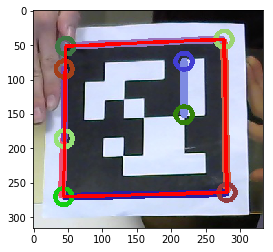

189
[array([300.8479 , 268.75336], dtype=float32), 748.8084503173827]
[array([309.97723 ,  44.978607], dtype=float32), 746.5198638916015]
[array([230.7981 , 267.85257], dtype=float32), 293.86180419921874]
[array([ 45.295074, 267.8641  ], dtype=float32), 751.0927093505859]
[array([159.90686 ,  48.565826], dtype=float32), 281.9909927368164]
[array([69.990944, 51.25644 ], dtype=float32), 720.2875381469727]
[array([241.79716, 154.37012], dtype=float32), 16.015548706054688]
[array([246.81717,  74.44988], dtype=float32), 16.015548706054688]
[array([248.70576 ,  44.382374], dtype=float32), 165.04193]


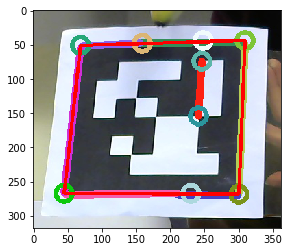

190
[array([263.26892, 229.11679], dtype=float32), 464.23388671875]
[array([288.62473,  49.8463 ], dtype=float32), 607.006802368164]
[array([175.0633 ,  51.08771], dtype=float32), 39.76280517578125]
[array([83.99022 , 52.417675], dtype=float32), 594.1772216796876]
[array([222.70111, 135.55809], dtype=float32), 11.424245452880859]
[array([231.60689,  79.13538], dtype=float32), 11.424245452880859]
[array([236.28471,  49.49918], dtype=float32), 145.89772]
[array([ 47.11093, 225.59001], dtype=float32), 459.55531921386716]


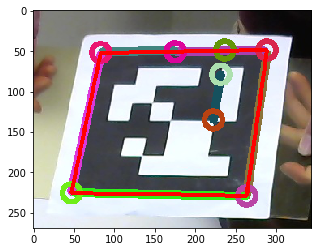

191
[array([292.69937, 250.88097], dtype=float32), 702.3946548461913]
[array([311.7968 ,  45.12584], dtype=float32), 507.03973388671875]
[array([183.68182, 251.4001 ], dtype=float32), 48.78257293701172]
[array([ 44.68724, 252.30472], dtype=float32), 709.0459686279297]
[array([82.23124 , 51.385365], dtype=float32), 507.5253662109375]
[array([241.4392 , 144.32364], dtype=float32), 14.824188232421875]
[array([250.11362 ,  70.712036], dtype=float32), 14.824188232421875]
[array([229.0052 , 249.83926], dtype=float32), 210.47992]


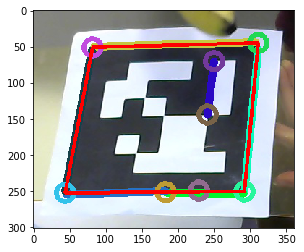

192
[array([285.64703, 267.5481 ], dtype=float32), 774.0690032958985]
[array([284.94046, 108.13407], dtype=float32), 44.00162811279297]
[array([284.27454,  43.54358], dtype=float32), 727.8655899047851]
[array([53.58639, 50.65247], dtype=float32), 728.7993408203124]
[array([ 46.56233, 270.24115], dtype=float32), 756.9939010620117]
[array([225.45233, 151.87523], dtype=float32), 15.250080871582032]
[array([225.43974 ,  75.624825], dtype=float32), 15.250080871582032]
[array([ 50.027252, 158.16599 ], dtype=float32), 42.534226989746095]


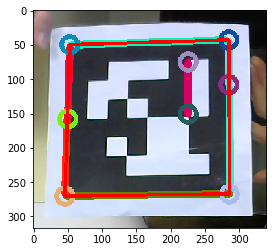

193
[array([293.3188 , 268.07687], dtype=float32), 544.8422637939453]
[array([285.9996 ,  43.19634], dtype=float32), 732.5178329467773]
[array([149.54391,  49.17856], dtype=float32), 271.74605865478514]
[array([54.30027 , 53.599617], dtype=float32), 918.9315612792968]
[array([ 53.519512, 275.36136 ], dtype=float32), 760.1013610839844]
[array([229.42136, 153.14748], dtype=float32), 15.511302185058593]
[array([227.97289,  75.60449], dtype=float32), 15.511302185058593]
[array([227.40259 ,  45.074394], dtype=float32), 181.36041]
[array([ 53.869614, 133.13263 ], dtype=float32), 43.001068115234375]
[array([54.36598 , 21.130177], dtype=float32), 215.00534]


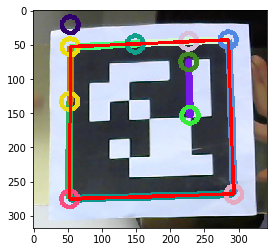

194
[array([294.8764 , 293.45535], dtype=float32), 780.0171409606934]
[array([293.1902 , 228.15433], dtype=float32), 47.766237640380865]
[array([289.02356 ,  49.113365], dtype=float32), 794.8307861328126]
[array([ 49.014236, 303.21368 ], dtype=float32), 776.4296264648438]
[array([46.85698, 60.99246], dtype=float32), 770.7519622802735]
[array([ 47.734478, 187.88919 ], dtype=float32), 45.25111389160156]


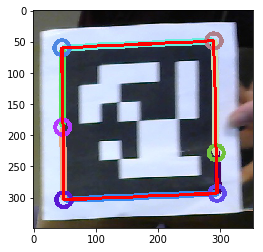

195
[array([306.35904, 271.131  ], dtype=float32), 674.1172470092773]
[array([308.57623, 144.39215], dtype=float32), 44.01632843017578]
[array([310.1724,  45.066 ], dtype=float32), 728.6648681640625]
[array([71.45425, 48.60225], dtype=float32), 524.7923217773438]
[array([109.37085, 270.17056], dtype=float32), 39.00338134765625]
[array([ 49.886925, 269.81876 ], dtype=float32), 452.7735992431641]
[array([245.1047 , 151.85446], dtype=float32), 15.517523193359375]
[array([248.1656 ,  74.32725], dtype=float32), 15.517523193359375]


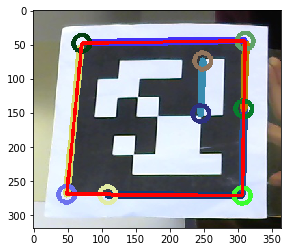

196
[array([290.29782, 249.6076 ], dtype=float32), 694.9912948608398]
[array([309.83646 ,  44.293358], dtype=float32), 452.5342559814453]
[array([224.32695, 249.35922], dtype=float32), 433.6533828735351]
[array([ 42.31537, 249.10504], dtype=float32), 709.5424011230468]
[array([125.587555,  47.719433], dtype=float32), 35.76912231445313]
[array([80.62021, 49.3873 ], dtype=float32), 414.47125854492185]
[array([239.22371, 141.8558 ], dtype=float32), 14.108927917480468]
[array([248.10109,  71.87196], dtype=float32), 14.108927917480468]
xxx


In [ ]:
for i, file in enumerate(listfiles("./crop")):
#     if i != 89:
#         continue
#         pass

    print(i)
    find_quad(file)
    if i > 200:
        break

In [ ]:
# kernel = np.ones((10,10),np.uint8)
# thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
# thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

# nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=4)

# # minimum size of particles we want to keep (number of pixels)
# #here, it's a fixed value, but you can set it as you want, eg the mean of the sizes or whatever
# min_size = (img_width * img_height) // 10

# #your answer image
# thresh = np.zeros((output.shape), dtype=np.uint8)
# #for every component in the image, you keep it only if it's above min_size
# for i in range(1, nb_components):
#     #print(sizes[i], min_size)
#     if stats[i, 4] < min_size:
#         continue
# #     if stats[i, 0] == 0 or stats[i, 1] == 0:
# #         continue
# #     if stats[i, 0] + stats[i, 2] == img_width or stats[i, 1] + stats[i, 3] == img_height:
# #         continue
#     thresh[output == i] = 255

In [ ]:
# for p in final_points:
#     print(p)
#     cv2.circle(img, tuple(p), int(img_size / 200) + 3, rand_color(), thickness=5)

# _, contours, hier = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# for cnt in contours:
#     if cv2.contourArea(cnt) < img_height * img_width // 10:  # remove small areas like noise etc
#         continue
#     print(cv2.contourArea(cnt), img_height * img_width)
#     hull = cv2.convexHull(cnt)    # find the convex hull of contour
#     hull = cv2.approxPolyDP(hull,0.01 * cv2.arcLength(hull,True),True)
#     if len(hull) == 4:
#         cv2.drawContours(img,[hull],0,(0,0,255),5)

# gray = np.mean(img, axis=2, dtype=np.uint8)
# dst = cv2.cornerHarris(thresh, 2, 3, 0.04)
# corners = cv2.findNonZero((dst > 0.2 * dst.max()).astype(np.uint8))

# filtered_corners = []
# for corner in corners:
#     corner = tuple(corner[0])
#     x, y = corner
#     padding = 0.15
#     if (x > padding * img_width and x < (1 - padding) * img_width) \
#          and (y > padding * img_height and y < (1 - padding) * img_height):
#         continue
    
#     filtered_corners.append(corner)
#     def component():
#         return random.randint(0,255)
#     col = (component(), component(), component())

#     cv2.circle(img, corner, int(img_size / 200) + 3, col, thickness=1)
# print(len(filtered_corners))

#result is dilated for marking the corners, not important

# Threshold for an optimal value, it may vary depending on the image.
# img[dst>0.01*dst.max()]=[0,0,255]

# image,contours,hier = cv2.findContours(thresh,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)

# edges = cv2.Canny(thresh, 50, 150, apertureSize=3)
# kernel = np.ones((3,3),np.uint8)
# edges = cv2.morphologyEx(thresh, cv2.MORPH_GRADIENT, kernel)
# plt.imshow(edges)
# lines = cv2.HoughLines(edges, 1, np.pi/180, 200)
# print(len(lines))
# for line in lines:
#     for rho,theta in line:
#         a = np.cos(theta)
#         b = np.sin(theta)
#         x0 = a*rho
#         y0 = b*rho
#         x1 = int(x0 + 1000*(-b))
#         y1 = int(y0 + 1000*(a))
#         x2 = int(x0 - 1000*(-b))
#         y2 = int(y0 - 1000*(a))

#         cv2.line(img,(x1,y1),(x2,y2),(0,0,255),2)

# edges = cv2.Canny(thresh, 50, 150, apertureSize=3)
# plt.imshow(edges)
# minLineLength = 2
# maxLineGap = 20
# lines = cv2.HoughLinesP(edges,1,np.pi/180,20,minLineLength,maxLineGap)
# for line in lines:
#     for x1,y1,x2,y2 in line:
#         cv2.line(img,(x1,y1),(x2,y2),(0,255,0),2)

